<a href="https://colab.research.google.com/github/mirkomerlinos/CS_Assignment/blob/main/Assignment_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

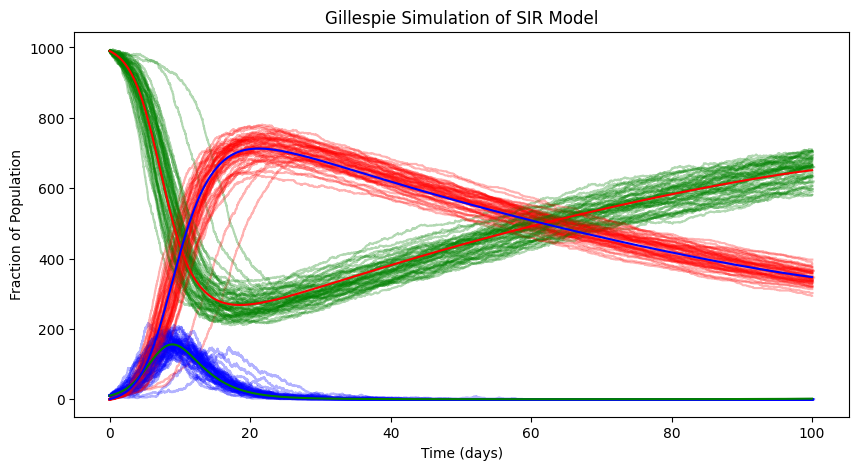

In [57]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
import math

np.random.seed(0)

def SIR_model_dem(t, y, beta, gamma, miu, N):
    S, I, R = y
    dSdt = miu*N - beta * S * I/N - miu * S
    dIdt = beta * S * I/N - gamma * I - miu*I
    dRdt = gamma * I - miu*R
    return [dSdt, dIdt, dRdt]

# Initial conditions, randomly chosen keeping in mind no recovered population at time zero.
N = 1000
I0 = 10
S0 = N - I0
R0 = N - S0 - I0
y0 = [S0, I0, R0]

# Time span for integration in days, equivalent to a year.
t_span = [0, 100]
# Interval of points for which to store results.
t_eval = np.linspace(0, 100, 1000)

# parameters for the SIR model with demography.
beta_dem = 1
gamma_dem = 0.5
miu_dem = 1/100 # birth/death rate, value taken as shown in examples from "Modeling Infectious Diseases in Humans and Animals"
v = miu_dem
# Solve the differential equations in the scenario with an epidemic.
sol_dem = solve_ivp(SIR_model_dem, t_span, y0, args=(beta_dem, gamma_dem, miu_dem, N), t_eval=t_eval)
# return values of the solution over t from t_span
S_dem, I_dem, R_dem = sol_dem.y

# Gillespie SIR model
def SIR_gillespie(t_break, beta, gamma, miu):
    # Initialize arrays to store values
    N = 1000  # Total population
    i = [10]   # Infected
    s = [N-i[0]]  # Susceptible
    r = [N-s[0]-i[0]]    # Recovered
    t = [0]

    while t[-1] < t_break:
        # Calculate rates for each event
        N = s[-1] + i[-1] + r[-1]
        if N == 0:
            break  # No population left
        rate_1 = miu * N     # Birth into susceptible
        rate_2 = beta * (s[-1] * i[-1])/N  # Infection
        rate_3 = gamma * i[-1]  # Recovery
        rate_4 = miu * s[-1]  # Natural death of susceptible
        rate_5 = miu * i[-1]  # Natural death of infected
        rate_6 = miu * r[-1]  # Natural death of recovered

        # Total rate of all events
        r_t = rate_1 + rate_2 + rate_3 + rate_4 + rate_5 + rate_6

        if r_t == 0:
            break

        # Time to next event
        rand_1 = np.random.uniform(0, 1)
        tau = -math.log(rand_1) / r_t
        t.append(t[-1] + tau)

        # Select which event occurs using cumulative sum of rates
        rand_2 = np.random.uniform(0, 1)
        p = rand_2 * r_t
        cumulative_rate = 0
        if cumulative_rate < p <= (cumulative_rate + rate_1):
            s.append(s[-1] + 1)  # Birth increases susceptible
            i.append(i[-1])
            r.append(r[-1])
        cumulative_rate += rate_1
        if cumulative_rate < p <= (cumulative_rate + rate_2):
          if s[-1] > 0:  # Ensure susceptible population doesn't go negative
            s.append(s[-1] - 1)  # Infection
            i.append(i[-1] + 1)
            r.append(r[-1])
        cumulative_rate += rate_2
        if cumulative_rate < p <= (cumulative_rate + rate_3):
          if i[-1] > 0:  # Ensure infected population doesn't go negative
            s.append(s[-1])
            i.append(i[-1] - 1)  # Recovery
            r.append(r[-1] + 1)
        cumulative_rate += rate_3
        if cumulative_rate < p <= (cumulative_rate + rate_4):
          if s[-1] > 0:  # Ensure susceptible population doesn't go negative
            s.append(s[-1] - 1)  # Natural death of susceptible
            i.append(i[-1])
            r.append(r[-1])
        cumulative_rate += rate_4
        if cumulative_rate < p <= (cumulative_rate + rate_5):
          if i[-1] > 0:  # Ensure infected population doesn't go negative
            s.append(s[-1])
            i.append(i[-1] - 1)  # Natural death of infected
            r.append(r[-1])
        cumulative_rate += rate_5
        if cumulative_rate < p <= (cumulative_rate + rate_6):
          if r[-1] > 0:  # Ensure recovered population doesn't go negative
            s.append(s[-1])
            i.append(i[-1])
            r.append(r[-1] - 1)  # Natural death of recovered
        cumulative_rate += rate_6
    return t, s, i, r


# Parameters
t_break = 100
beta = 1
gamma = 0.5
miu = 1/100

# Simulate using Gillespie
plt.figure(figsize=(10, 5))
for z in range(50):
    t, s, i, r = SIR_gillespie(t_break, beta, gamma, miu)
    # Plot results
    plt.plot(t, s, label='Susceptible (Gillespie)', color='green', alpha=0.3)
    plt.plot(t, i, label='Infected (Gillespie)', color='blue', alpha=0.3)
    plt.plot(t, r, label='Recovered (Gillespie)', color='red', alpha=0.3)

plt.title("Gillespie Simulation of SIR Model")
plt.xlabel("Time (days)")
plt.ylabel("Fraction of Population")

plt.plot(sol_dem.t, S_dem, label="Susceptible", color='red')
plt.plot(sol_dem.t, I_dem, label="Infected", color='green')
plt.plot(sol_dem.t, R_dem, label="Recovered", color='blue')

plt.show()

#add average of s, i and r from the 50 iterations of GA, supposedly noise has been added, but is later in the jupyter notebook.


covariance between S and I (with miu 0.01 , beta 1 , gamma 0.5 )=  27386.114111111114


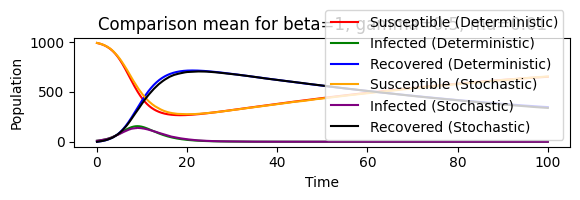

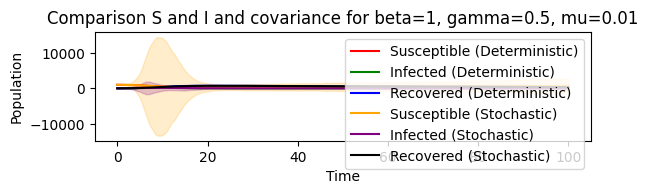

covariance between S and I (with miu 0.005 , beta 1 , gamma 0.5 )=  24109.116573573574


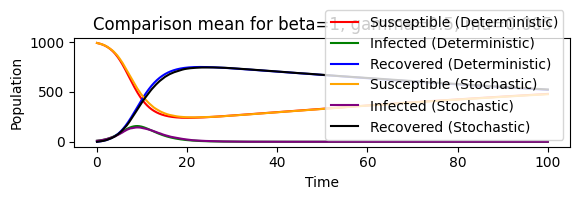

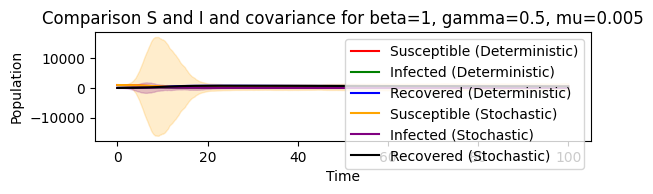

covariance between S and I (with miu 0.002 , beta 1 , gamma 0.5 )=  29780.80561261263


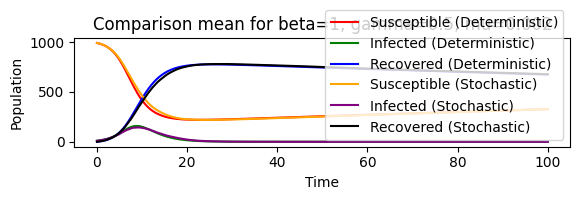

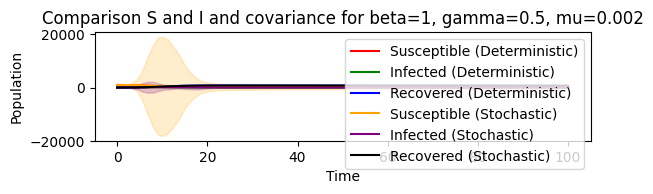

covariance between S and I (with miu 0.01 , beta 1 , gamma 1.5 )=  207.50393593593614


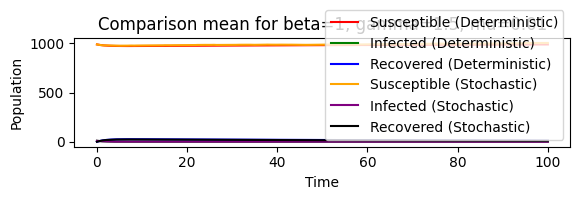

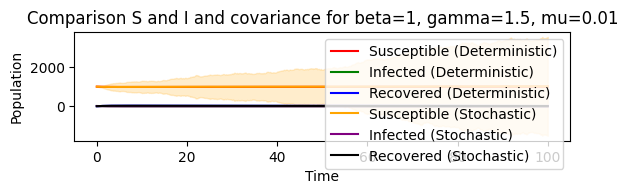

covariance between S and I (with miu 0.005 , beta 1 , gamma 1.5 )=  44.675438438438476


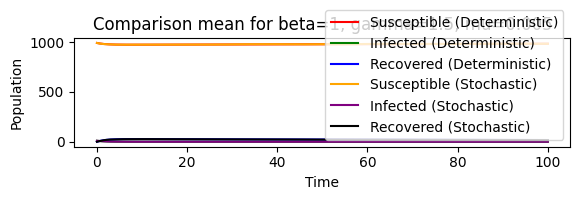

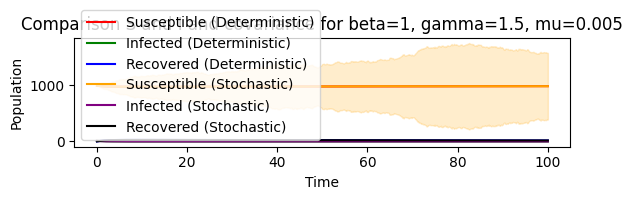

covariance between S and I (with miu 0.002 , beta 1 , gamma 1.5 )=  16.59154154154149


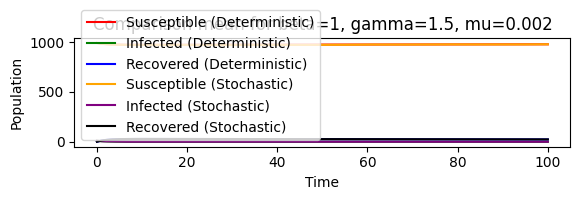

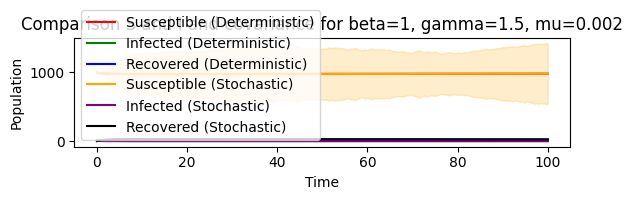

covariance between S and I (with miu 0.01 , beta 1 , gamma 2.5 )=  -37.635261261261206


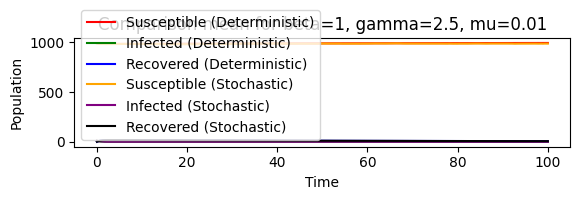

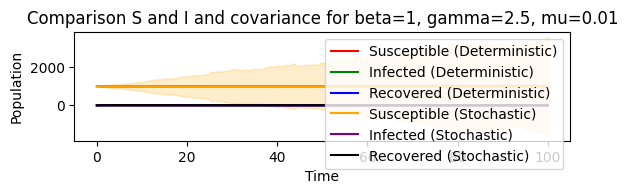

covariance between S and I (with miu 0.005 , beta 1 , gamma 2.5 )=  151.37695095095097


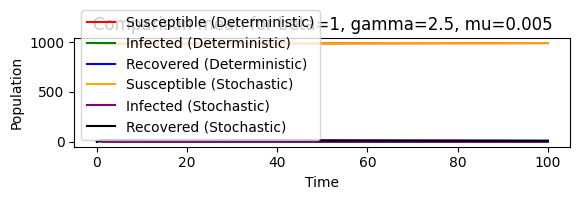

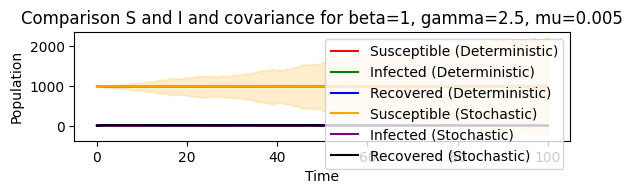

covariance between S and I (with miu 0.002 , beta 1 , gamma 2.5 )=  -126.51948848848842


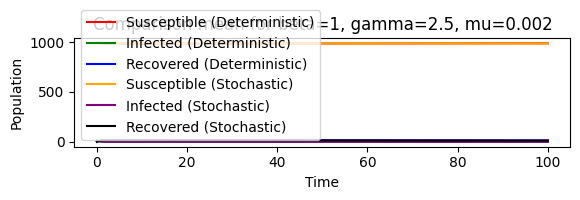

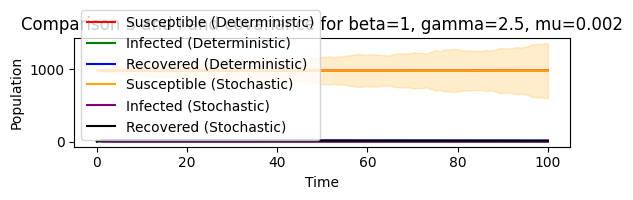

covariance between S and I (with miu 0.01 , beta 2 , gamma 0.5 )=  37642.92536336335


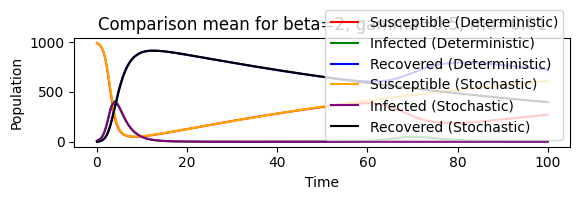

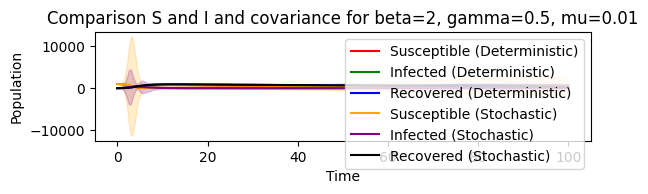

covariance between S and I (with miu 0.005 , beta 2 , gamma 0.5 )=  22589.823623623623


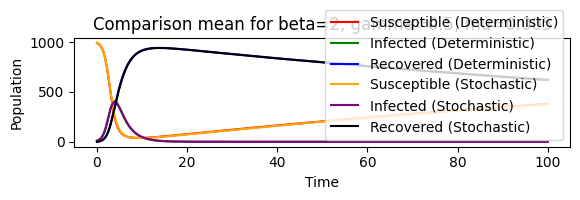

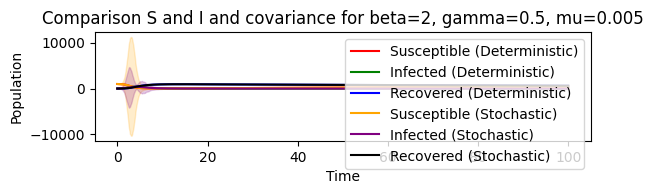

covariance between S and I (with miu 0.002 , beta 2 , gamma 0.5 )=  19208.534779779762


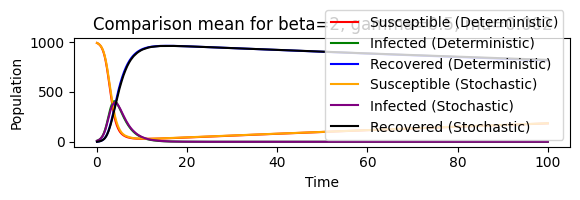

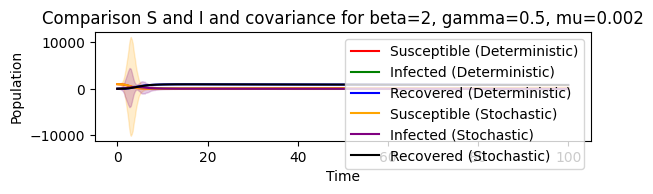

covariance between S and I (with miu 0.01 , beta 2 , gamma 1.5 )=  6942.763551551555


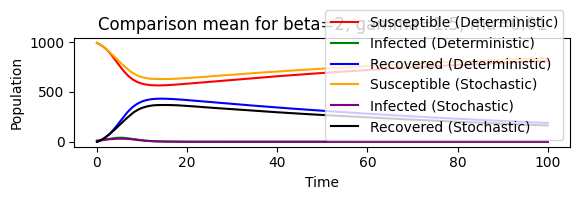

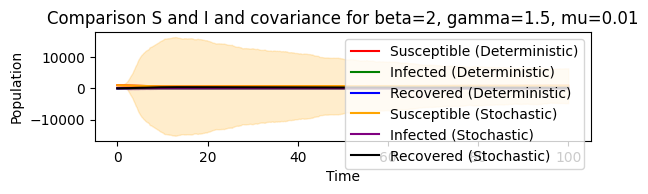

covariance between S and I (with miu 0.005 , beta 2 , gamma 1.5 )=  6804.30205205205


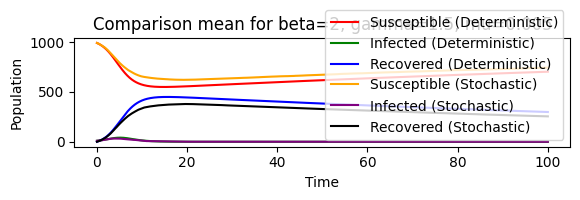

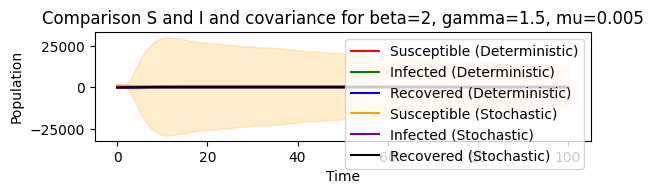

covariance between S and I (with miu 0.002 , beta 2 , gamma 1.5 )=  6315.199433433443


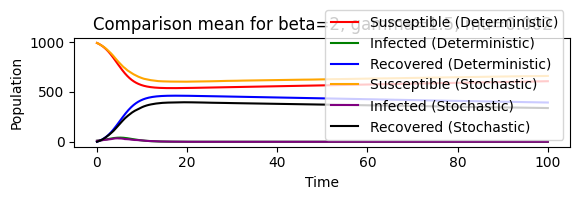

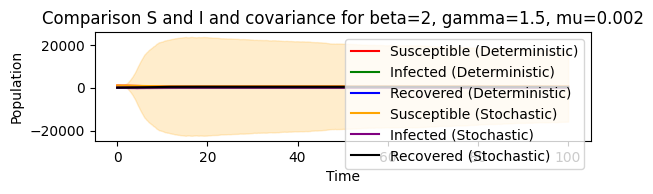

covariance between S and I (with miu 0.01 , beta 2 , gamma 2.5 )=  -12.834818818818798


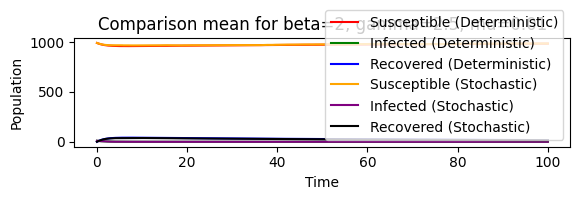

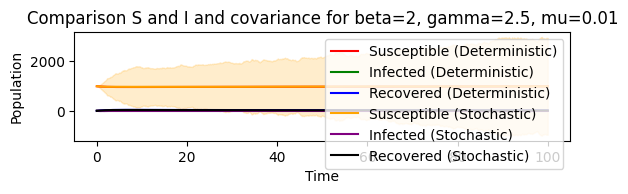

covariance between S and I (with miu 0.005 , beta 2 , gamma 2.5 )=  96.88595995996


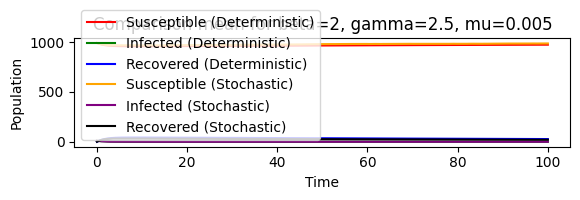

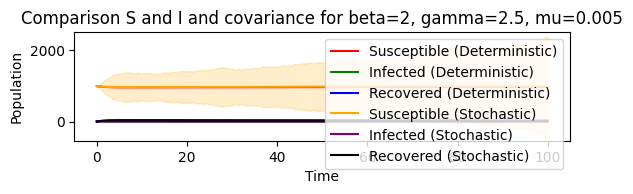

covariance between S and I (with miu 0.002 , beta 2 , gamma 2.5 )=  -34.23139239239243


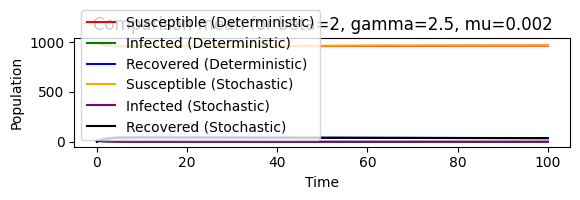

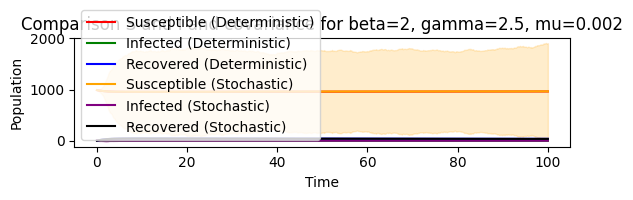

covariance between S and I (with miu 0.01 , beta 3 , gamma 0.5 )=  37168.51094694694


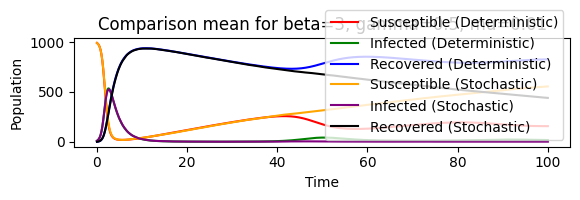

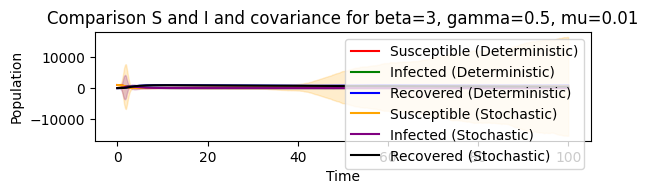

covariance between S and I (with miu 0.005 , beta 3 , gamma 0.5 )=  20790.15296096096


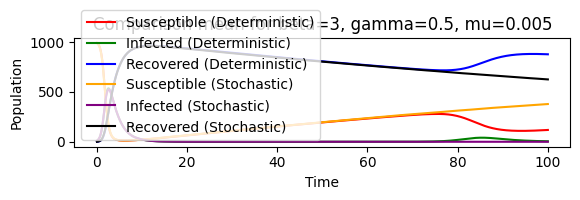

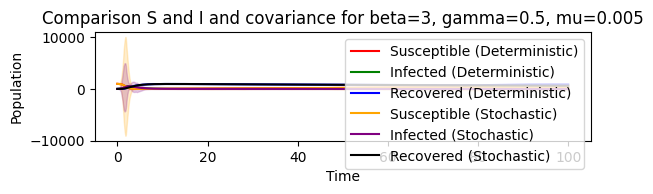

covariance between S and I (with miu 0.002 , beta 3 , gamma 0.5 )=  14521.358207207199


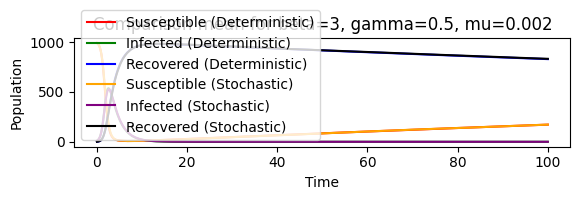

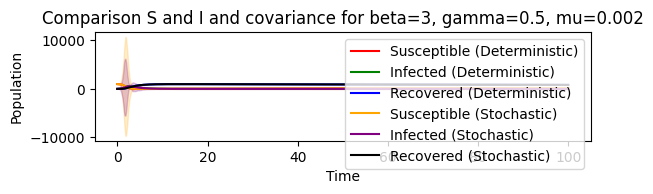

covariance between S and I (with miu 0.01 , beta 3 , gamma 1.5 )=  20812.656545545557


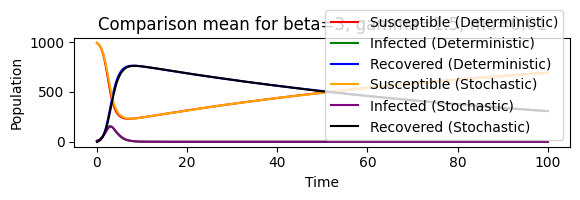

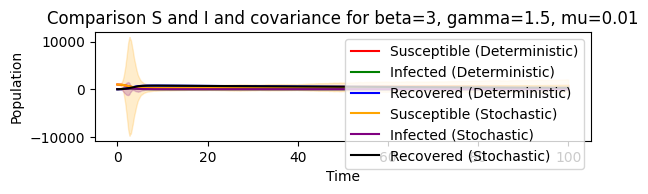

covariance between S and I (with miu 0.005 , beta 3 , gamma 1.5 )=  13936.597373373374


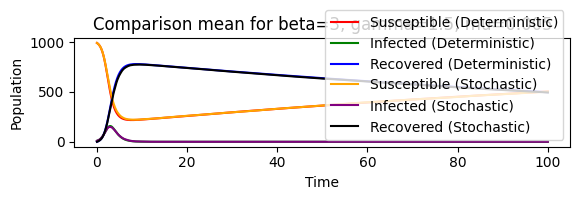

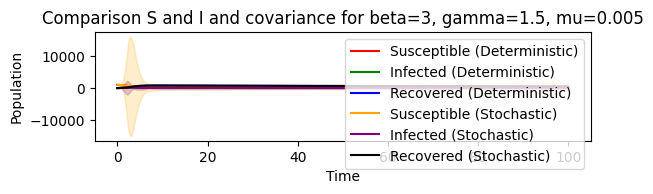

covariance between S and I (with miu 0.002 , beta 3 , gamma 1.5 )=  10797.062802802817


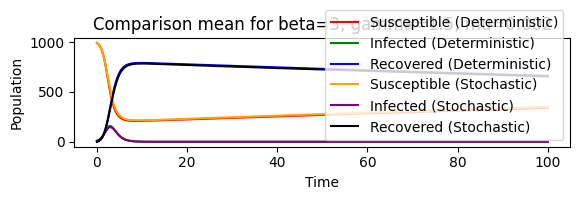

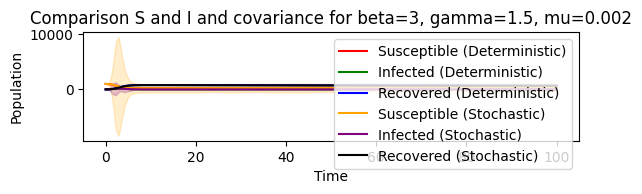

covariance between S and I (with miu 0.01 , beta 3 , gamma 2.5 )=  8728.25791191191


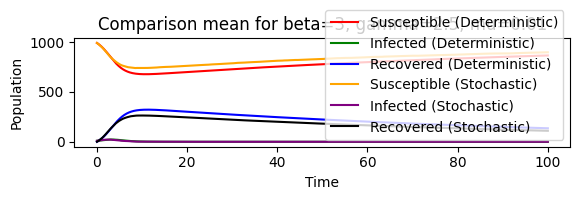

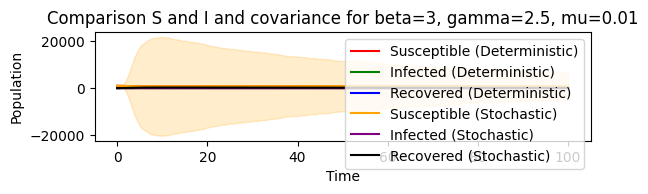

covariance between S and I (with miu 0.005 , beta 3 , gamma 2.5 )=  5306.816006006009


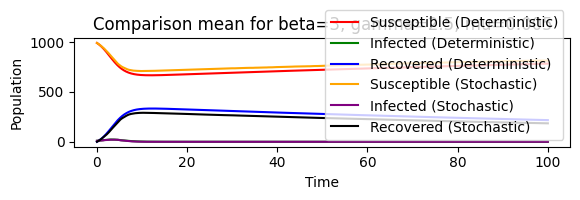

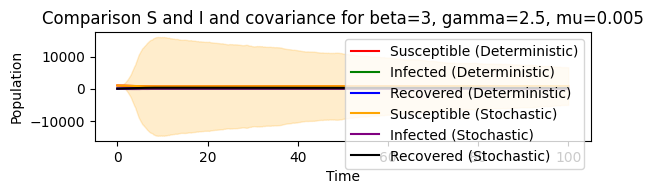

covariance between S and I (with miu 0.002 , beta 3 , gamma 2.5 )=  2691.36937737738


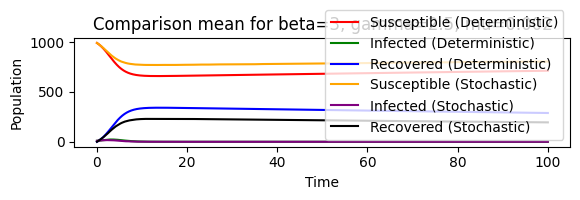

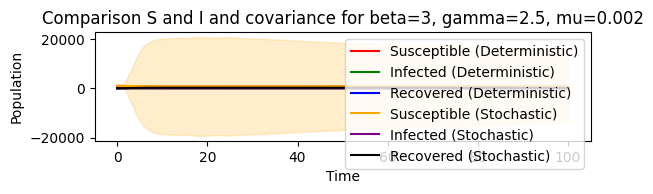

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
from scipy.interpolate import interp1d
import math

def SIR_model_dem(t, y, beta, gamma, miu):
    S, I, R = y
    dSdt = miu - beta * S * I - miu * S
    dIdt = beta * S * I - gamma * I - miu*I
    dRdt = gamma * I - miu*R
    return [dSdt, dIdt, dRdt]

def SIR_gillespie(t_break, beta, gamma, miu):
    s = [990]
    i = [10]
    r = [0]
    t = [0]

    while t[-1] < t_break:
        N = s[-1] + i[-1] + r[-1]
        if N == 0:
            break
        rate_1 = miu * N
        rate_2 = beta * (s[-1] * i[-1]) / N
        rate_3 = gamma * i[-1]
        rate_4 = miu * s[-1]
        rate_5 = miu * i[-1]
        rate_6 = miu * r[-1]

        r_t = rate_1 + rate_2 + rate_3 + rate_4 + rate_5 + rate_6
        if r_t == 0:
            break

        rand_1 = np.random.uniform(0, 1)
        tau = -math.log(rand_1) / r_t
        t.append(t[-1] + tau)

        rand_2 = np.random.uniform(0, 1)
        p = rand_2 * r_t
        cumulative_rate = 0
        if cumulative_rate < p <= (cumulative_rate + rate_1):
            s.append(s[-1] + 1)
            i.append(i[-1])
            r.append(r[-1])
        cumulative_rate += rate_1
        if cumulative_rate < p <= (cumulative_rate + rate_2):
            if s[-1] > 0:
                s.append(s[-1] - 1)
                i.append(i[-1] + 1)
                r.append(r[-1])
        cumulative_rate += rate_2
        if cumulative_rate < p <= (cumulative_rate + rate_3):
            if i[-1] > 0:
                s.append(s[-1])
                i.append(i[-1] - 1)
                r.append(r[-1] + 1)
        cumulative_rate += rate_3
        if cumulative_rate < p <= (cumulative_rate + rate_4):
            if s[-1] > 0:
                s.append(s[-1] - 1)
                i.append(i[-1])
                r.append(r[-1])
        cumulative_rate += rate_4
        if cumulative_rate < p <= (cumulative_rate + rate_5):
            if i[-1] > 0:
                s.append(s[-1])
                i.append(i[-1] - 1)
                r.append(r[-1])
        cumulative_rate += rate_5
        if cumulative_rate < p <= (cumulative_rate + rate_6):
            if r[-1] > 0:
                s.append(s[-1])
                i.append(i[-1])
                r.append(r[-1] - 1)
        cumulative_rate += rate_6
    return t, s, i, r

# Parameters
t_break = 100
# can cut up to here if it really works like a jupyter notebook and you do not need to repeat stuff
beta_values = [1, 2, 3]  # Example beta values
gamma_values = [0.5, 1.5, 2.5] # Example gamma values
mu_values = [1/100, 1/200, 1/500] # Example birth/death rates

# Number of time points in the deterministic solution
num_points = 1000

# Run multiple stochastic simulations and deterministic model for comparison
num_simulations = 50

for beta in beta_values:
    for gamma in gamma_values:
        for miu in mu_values:
            # Run deterministic model
            t_span = [0, 100]
            t_eval = np.linspace(0, 100, num_points)
            sol = solve_ivp(SIR_model_dem, t_span, [0.99, 0.01, 0], args=(beta, gamma, miu), t_eval=t_eval)
            S_det, I_det, R_det = sol.y

            # Run stochastic simulations
            S_stochastic = []
            I_stochastic = []
            R_stochastic = []
            for _ in range(num_simulations):
                t, s, i, r = SIR_gillespie(t_break, beta, gamma, miu)

                # Interpolate stochastic results to match deterministic time points. As a result, each list of S and I are equal in lenght, allowing for the use of
                #np.mean, np.var and np.cov later.
                f_s = interp1d(t, s, kind='previous', bounds_error=False, fill_value=(s[0], s[-1]))
                f_i = interp1d(t, i, kind='previous', bounds_error=False, fill_value=(i[0], i[-1]))
                f_r = interp1d(t, r, kind='previous', bounds_error=False, fill_value=(r[0], r[-1]))

                s_resampled = f_s(t_eval)
                i_resampled = f_i(t_eval)
                r_resampled = f_r(t_eval)

                S_stochastic.append(s_resampled)
                I_stochastic.append(i_resampled)
                R_stochastic.append(r_resampled)

            # Convert to NumPy arrays for easier manipulation
            S_stochastic = np.array(S_stochastic)
            I_stochastic = np.array(I_stochastic)
            R_stochastic = np.array(R_stochastic)


            # Calculate variance, covariance, and compare means
            S_mean = np.mean(S_stochastic, axis=0)
            I_mean = np.mean(I_stochastic, axis=0)
            R_mean = np.mean(R_stochastic, axis=0)
            S_var = np.var(S_stochastic, axis=0)
            I_var = np.var(I_stochastic, axis=0)
            cov_SI = np.cov(S_stochastic, I_stochastic)[0, 1]
            print("covariance between S and I (with miu", miu, ", beta", beta, ", gamma", gamma, ")= ", cov_SI)

            # Plot results, and investigate covariance/variance
            plt.figure()
            plt.subplot(3, 1, 1)
            plt.plot(sol.t, S_det*1000, label='Susceptible (Deterministic)', color='red')
            plt.plot(sol.t, I_det*1000, label='Infected (Deterministic)', color='green')
            plt.plot(sol.t, R_det*1000, label='Recovered (Deterministic)', color='blue')
            plt.plot(sol.t, S_mean, label='Susceptible (Stochastic)', color='orange')
            plt.plot(sol.t, I_mean, label='Infected (Stochastic)', color='purple')
            plt.plot(sol.t, R_mean, label='Recovered (Stochastic)', color='black')
            plt.title(f"Comparison mean for beta={beta}, gamma={gamma}, mu={miu}")
            plt.xlabel('Time')
            plt.ylabel('Population')
            plt.legend()
            plt.show()

            plt.figure()
            plt.subplot(3, 1, 2)
            plt.plot(sol.t, S_det*1000, label='Susceptible (Deterministic)', color='red')
            plt.plot(sol.t, I_det*1000, label='Infected (Deterministic)', color='green')
            plt.plot(sol.t, R_det*1000, label='Recovered (Deterministic)', color='blue')
            plt.plot(sol.t, S_mean, label='Susceptible (Stochastic)', color='orange')
            plt.plot(sol.t, I_mean, label='Infected (Stochastic)', color='purple')
            plt.plot(sol.t, R_mean, label='Recovered (Stochastic)', color='black')
            plt.fill_between(sol.t, S_mean - S_var, S_mean + S_var, alpha=0.2, color='orange')
            plt.fill_between(sol.t, I_mean - I_var, I_mean + I_var, alpha=0.2, color='purple')
            plt.title(f"Comparison S and I and covariance for beta={beta}, gamma={gamma}, mu={miu}")
            plt.xlabel('Time')
            plt.ylabel('Population')
            plt.legend()
            plt.show()
# iteration with cov printed as a singular value, but since most are positive so does not look right, so might delete.

Covariance at time t=0 (mu=0.01, beta=1, gamma=0.5): -152.19506163265305


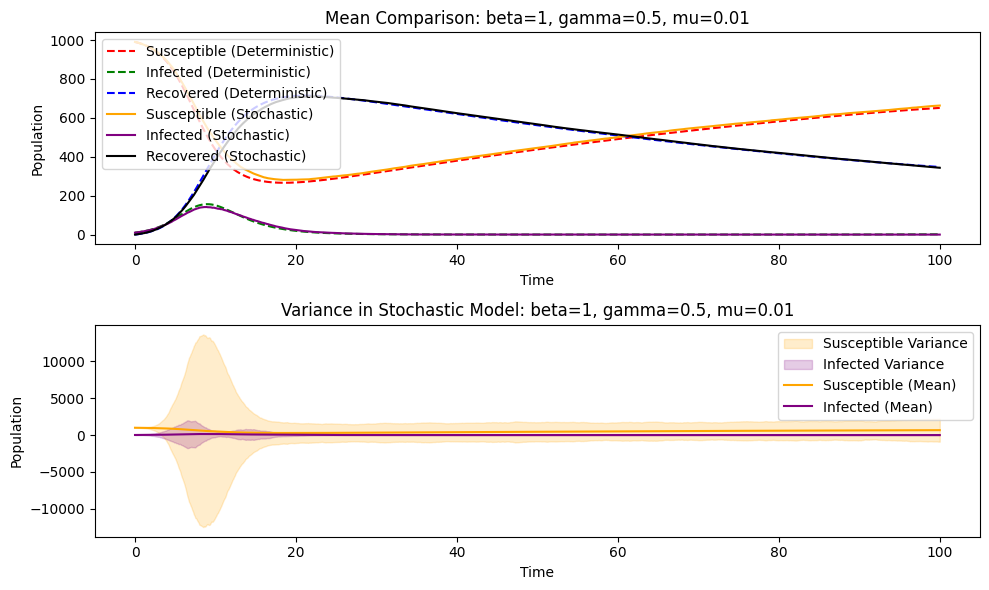

Covariance at time t=0 (mu=0.005, beta=1, gamma=0.5): -154.54310653061225


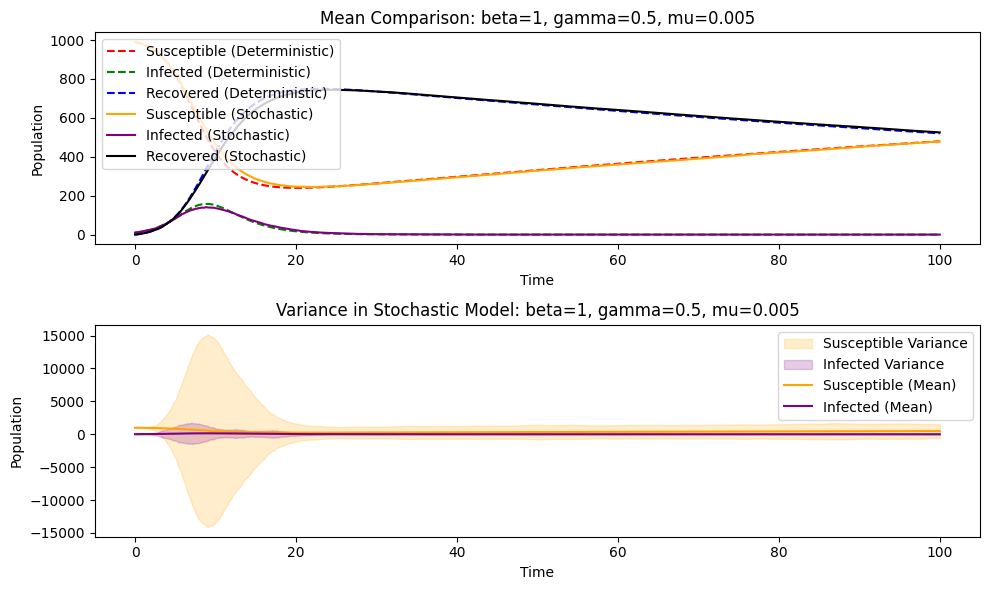

Covariance at time t=0 (mu=0.002, beta=1, gamma=0.5): -287.36727428571425


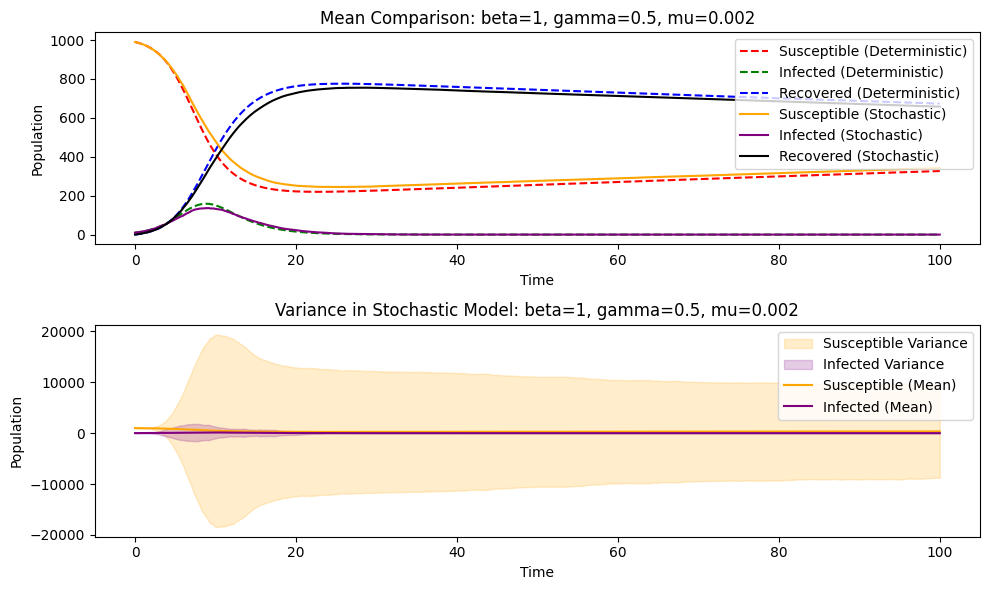

Covariance at time t=0 (mu=0.01, beta=1, gamma=1.5): -0.6706383673469388


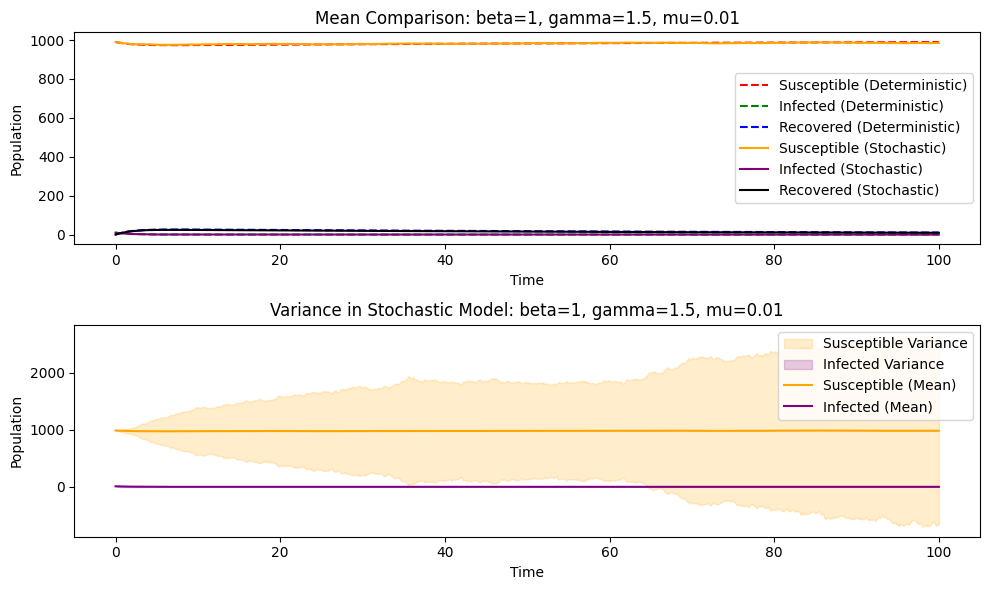

Covariance at time t=0 (mu=0.005, beta=1, gamma=1.5): -1.2291367346938773


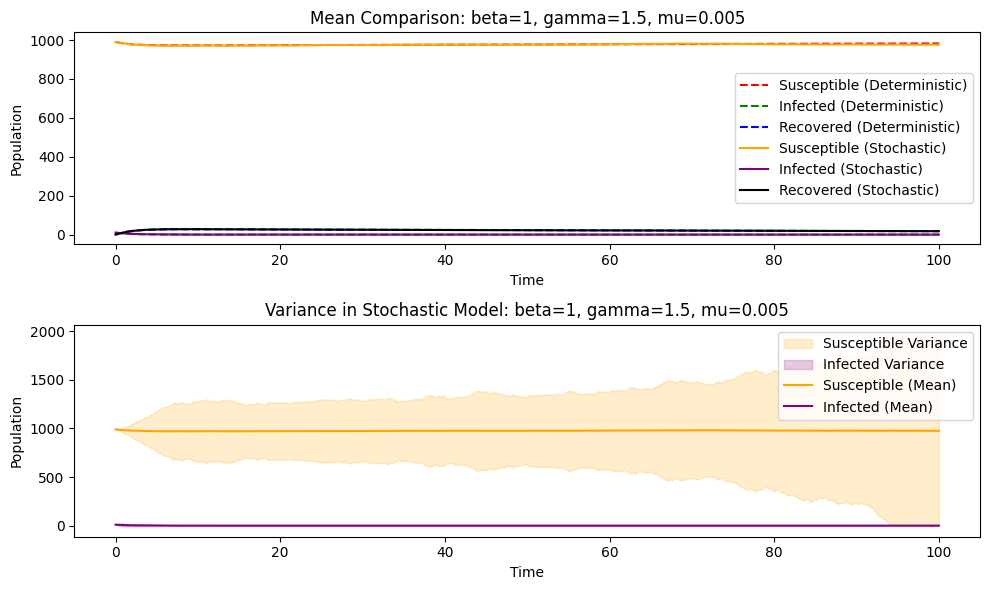

Covariance at time t=0 (mu=0.002, beta=1, gamma=1.5): -0.8683359183673469


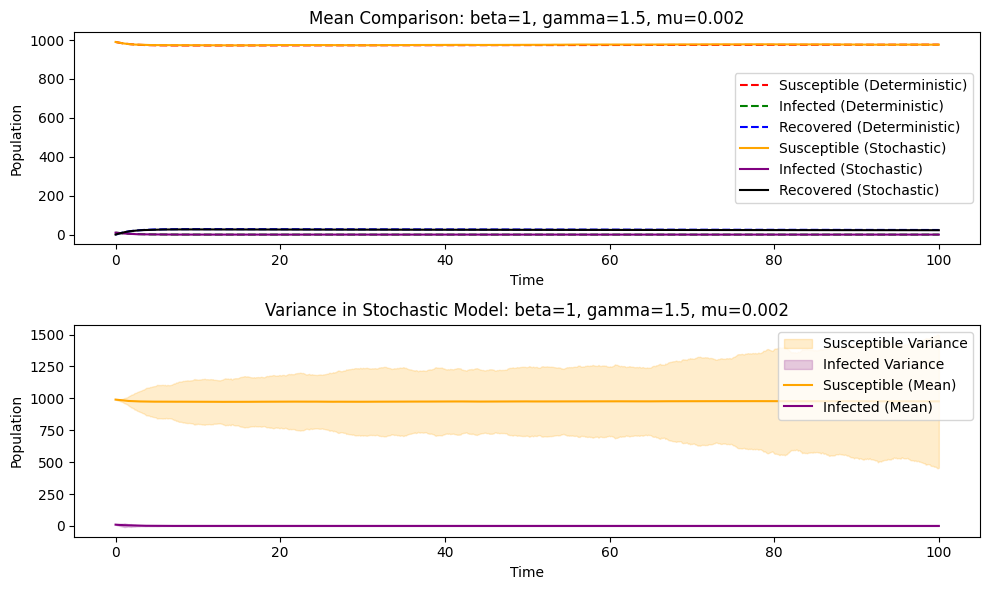

Covariance at time t=0 (mu=0.01, beta=1, gamma=2.5): -0.07681142857142856


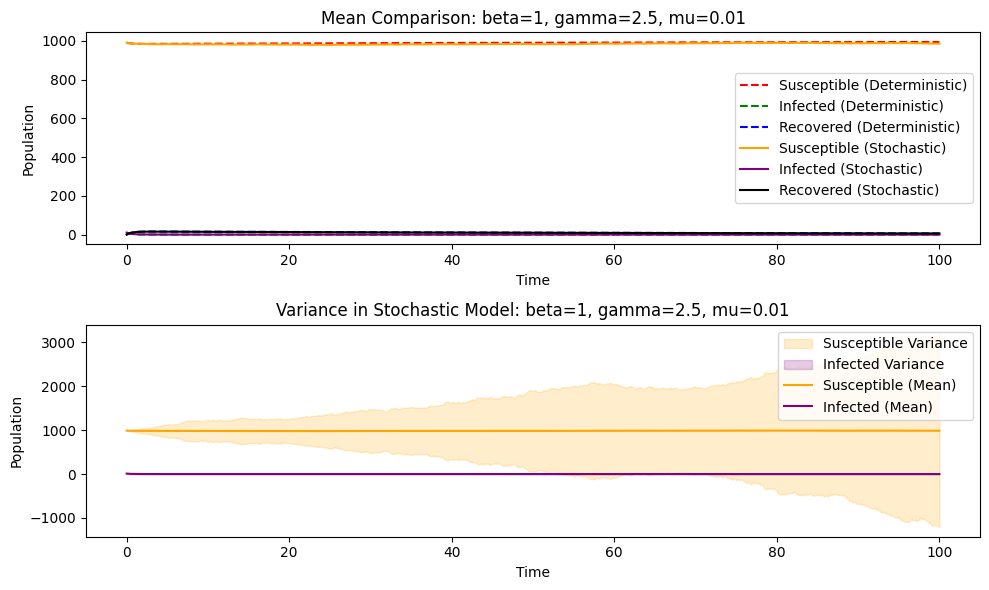

Covariance at time t=0 (mu=0.005, beta=1, gamma=2.5): -0.07168857142857143


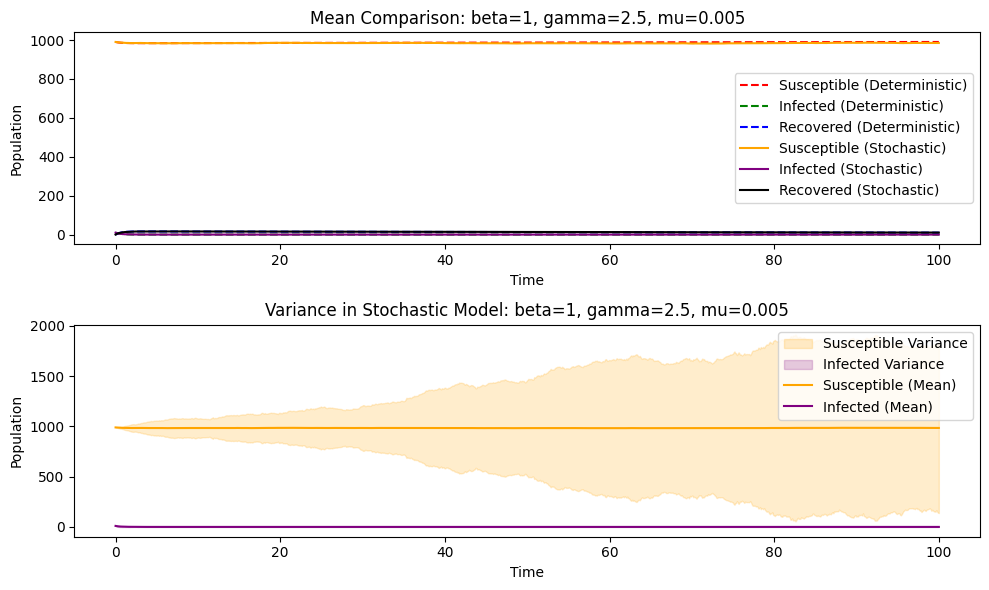

Covariance at time t=0 (mu=0.002, beta=1, gamma=2.5): -0.10025877551020405


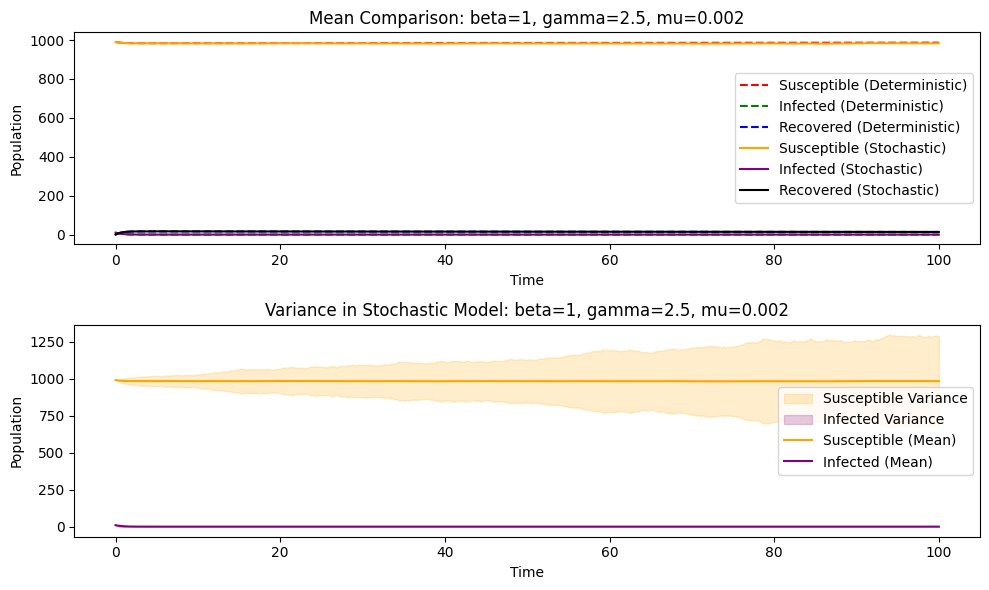

Covariance at time t=0 (mu=0.01, beta=2, gamma=0.5): -99.71112285714285


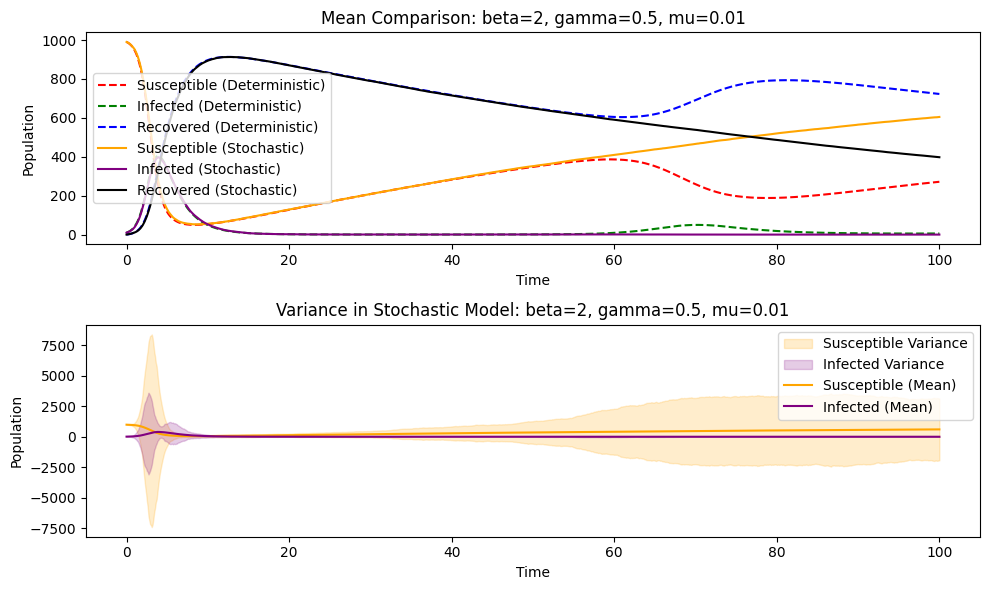

Covariance at time t=0 (mu=0.005, beta=2, gamma=0.5): -84.11373632653059


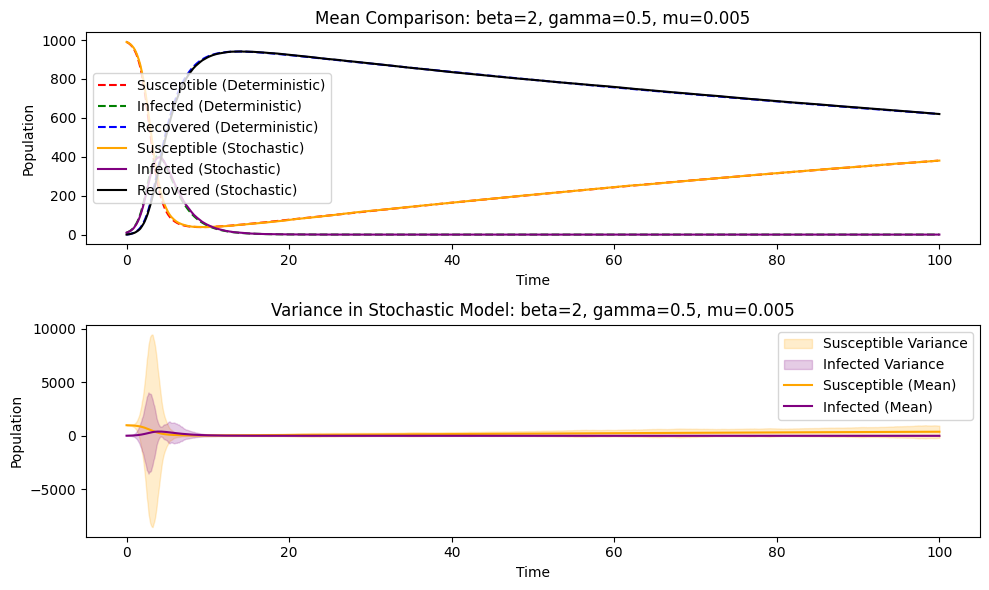

Covariance at time t=0 (mu=0.002, beta=2, gamma=0.5): -67.3516081632653


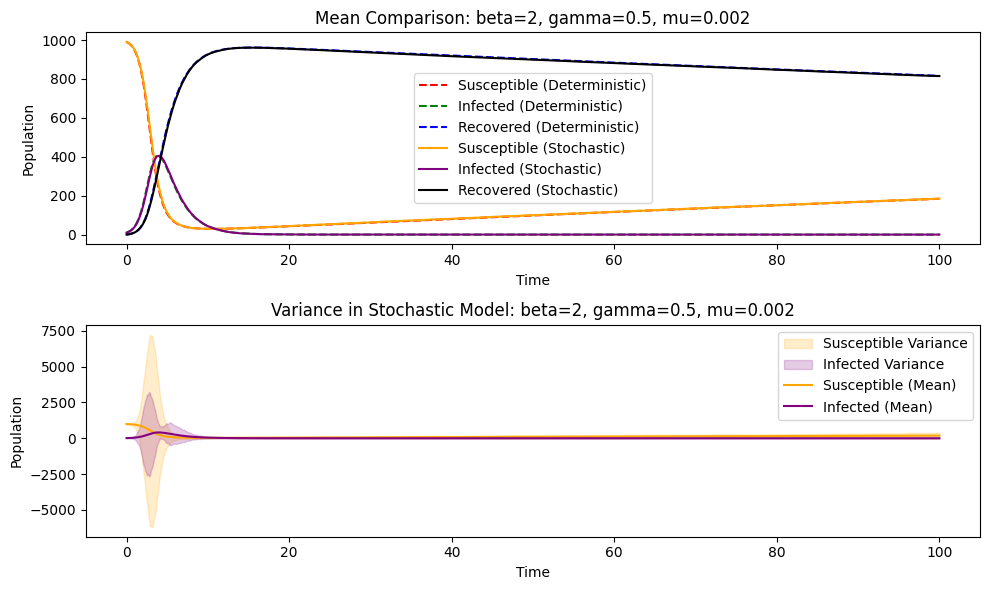

Covariance at time t=0 (mu=0.01, beta=2, gamma=1.5): -105.77376857142858


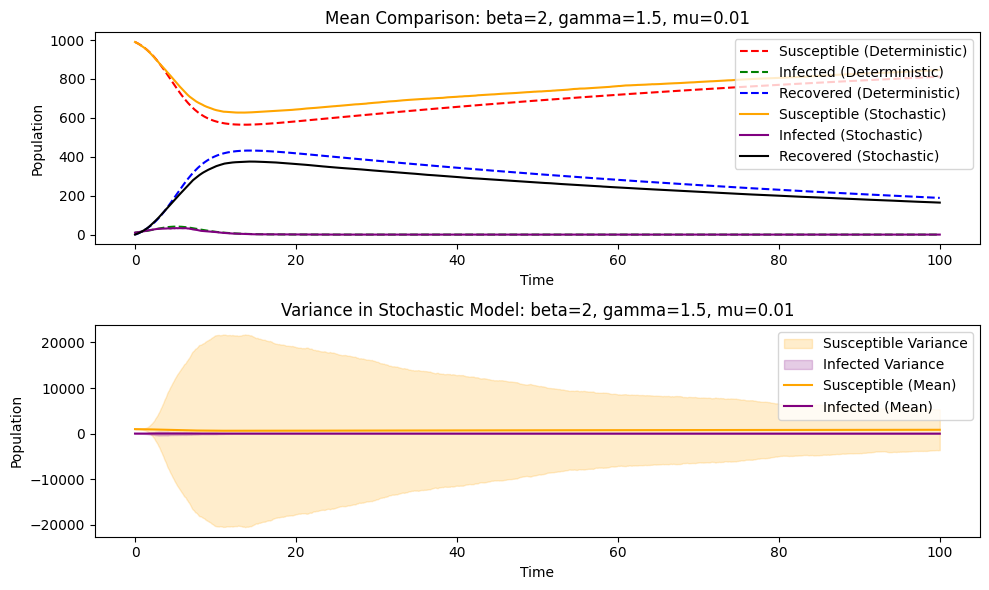

Covariance at time t=0 (mu=0.005, beta=2, gamma=1.5): -152.92886489795916


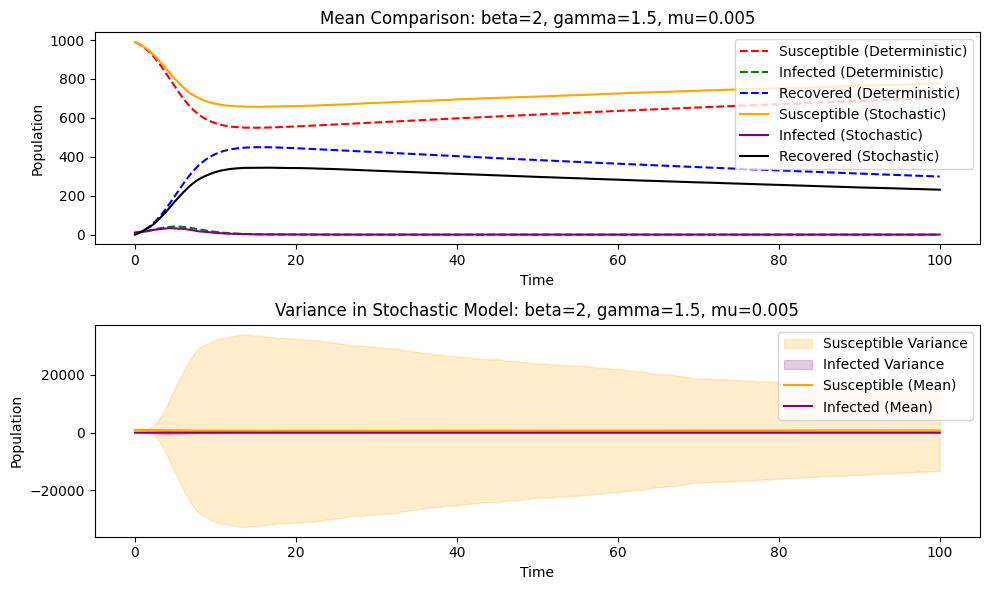

Covariance at time t=0 (mu=0.002, beta=2, gamma=1.5): -59.9780187755102


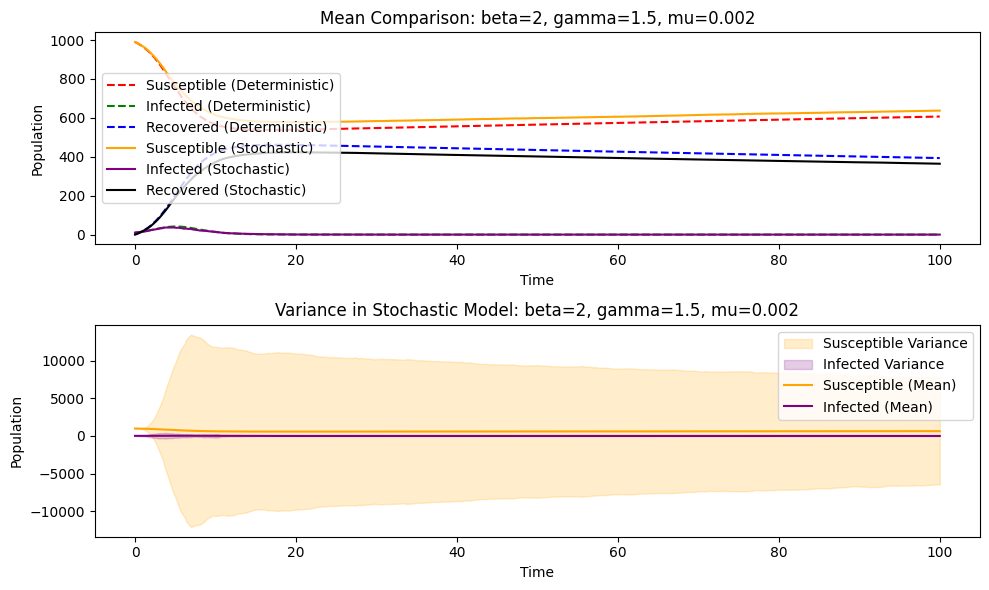

Covariance at time t=0 (mu=0.01, beta=2, gamma=2.5): -2.998063673469387


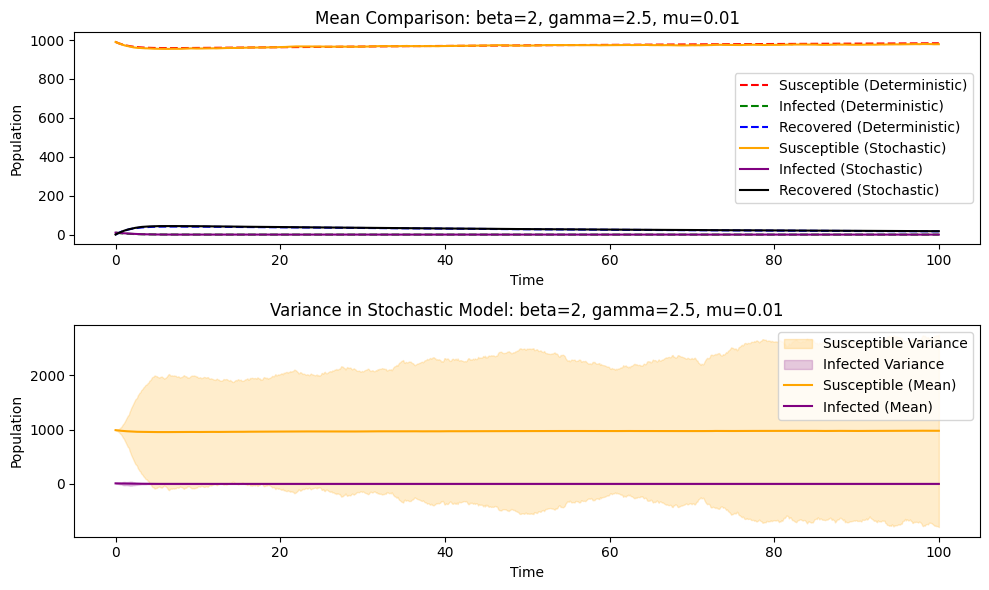

Covariance at time t=0 (mu=0.005, beta=2, gamma=2.5): -2.0171579591836735


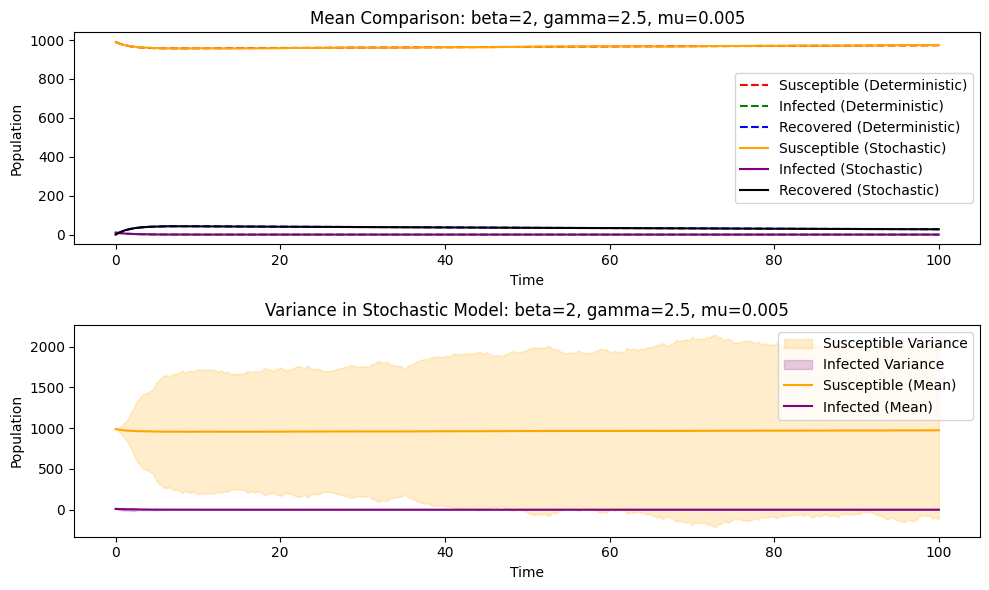

Covariance at time t=0 (mu=0.002, beta=2, gamma=2.5): -3.6510036734693876


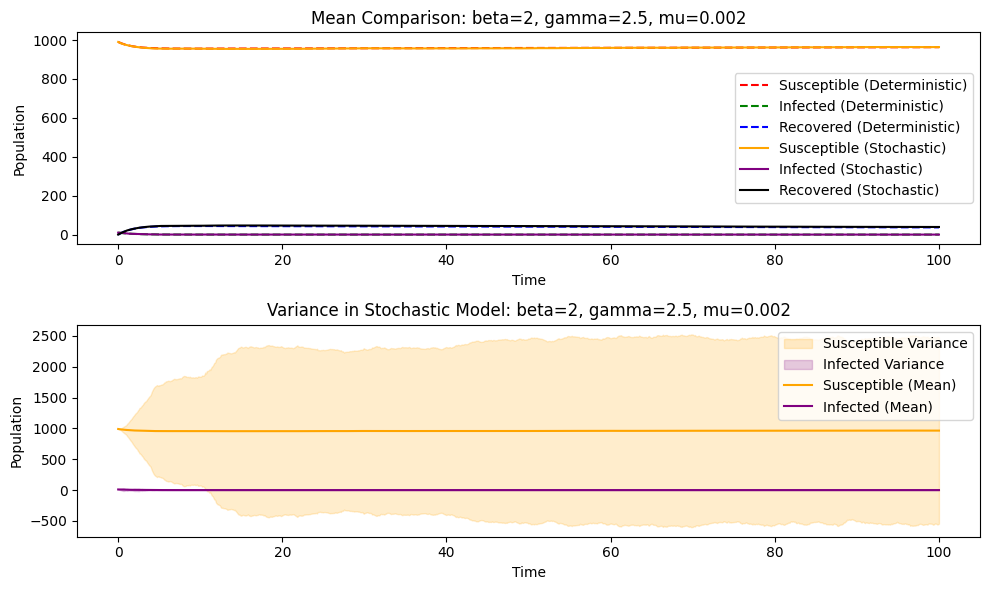

Covariance at time t=0 (mu=0.01, beta=3, gamma=0.5): -187.78116653061224


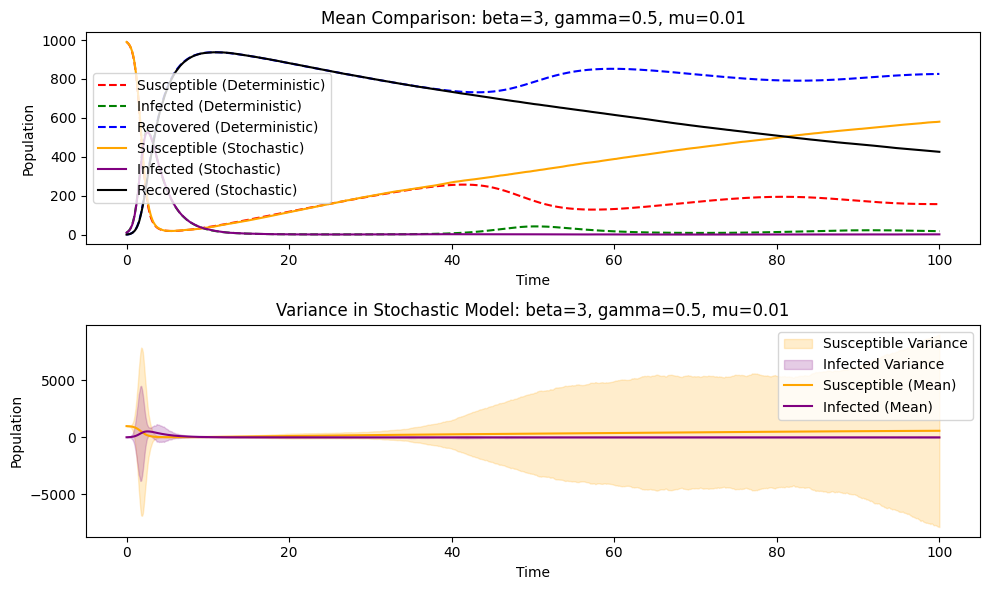

Covariance at time t=0 (mu=0.005, beta=3, gamma=0.5): -68.83188285714284


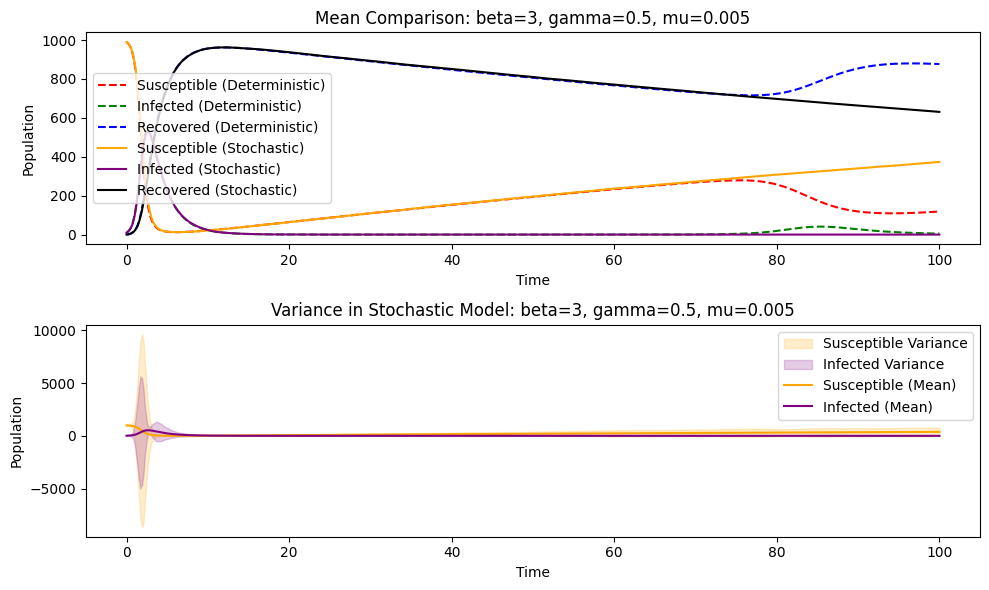

Covariance at time t=0 (mu=0.002, beta=3, gamma=0.5): -65.41854734693877


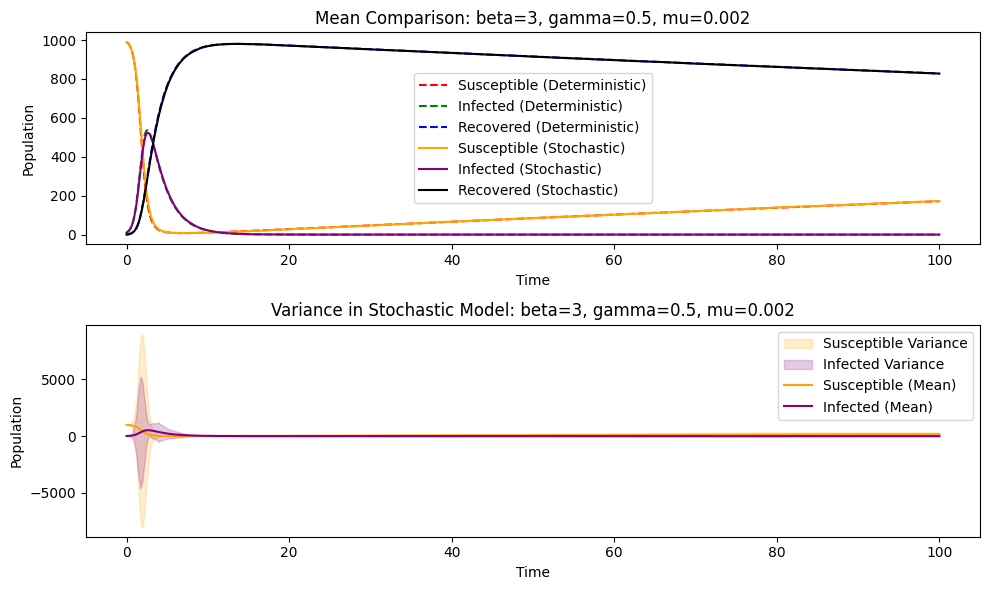

Covariance at time t=0 (mu=0.01, beta=3, gamma=1.5): -38.32509510204082


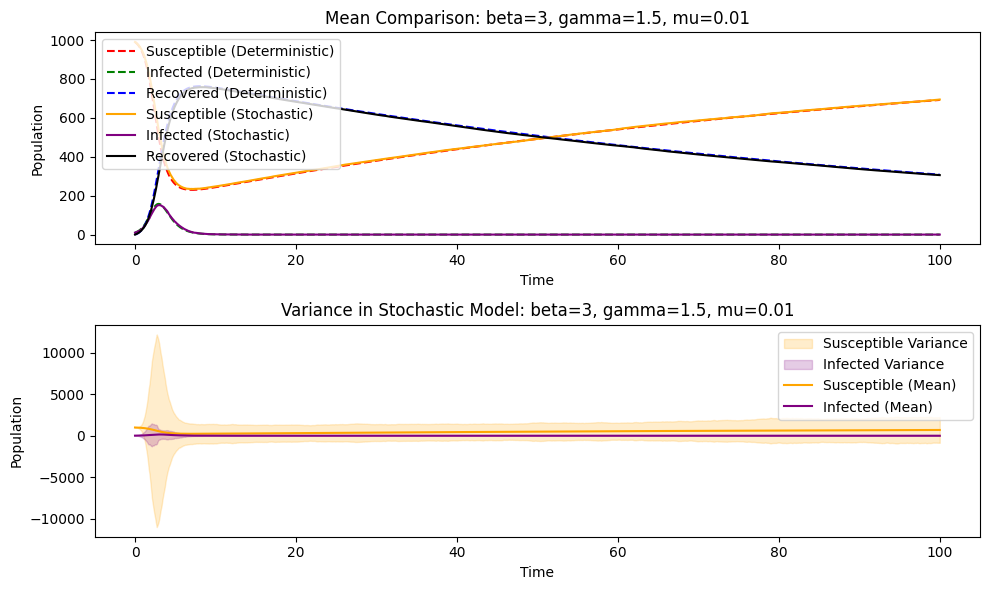

Covariance at time t=0 (mu=0.005, beta=3, gamma=1.5): -36.866021632653066


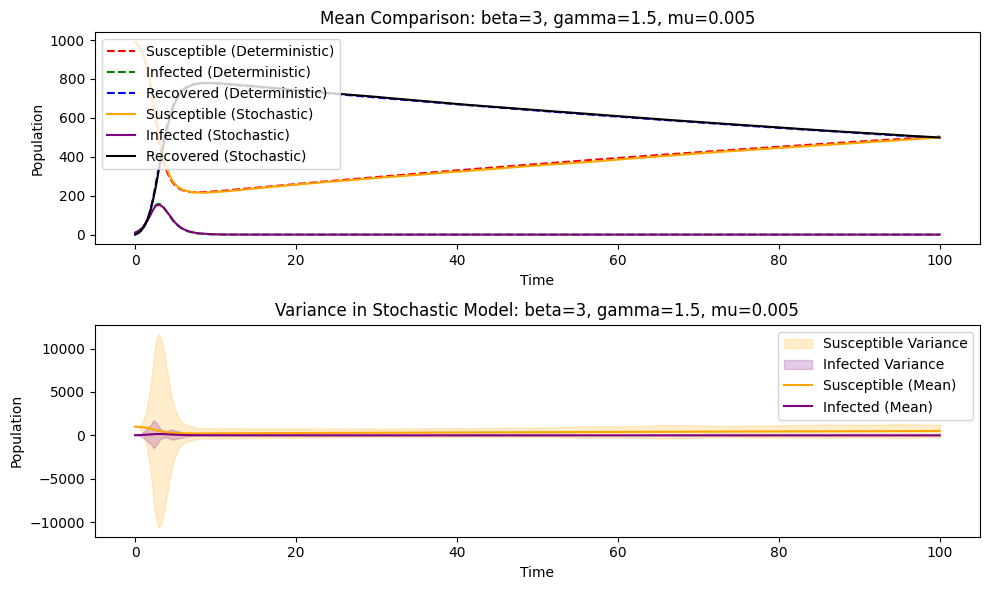

Covariance at time t=0 (mu=0.002, beta=3, gamma=1.5): -35.70110081632653


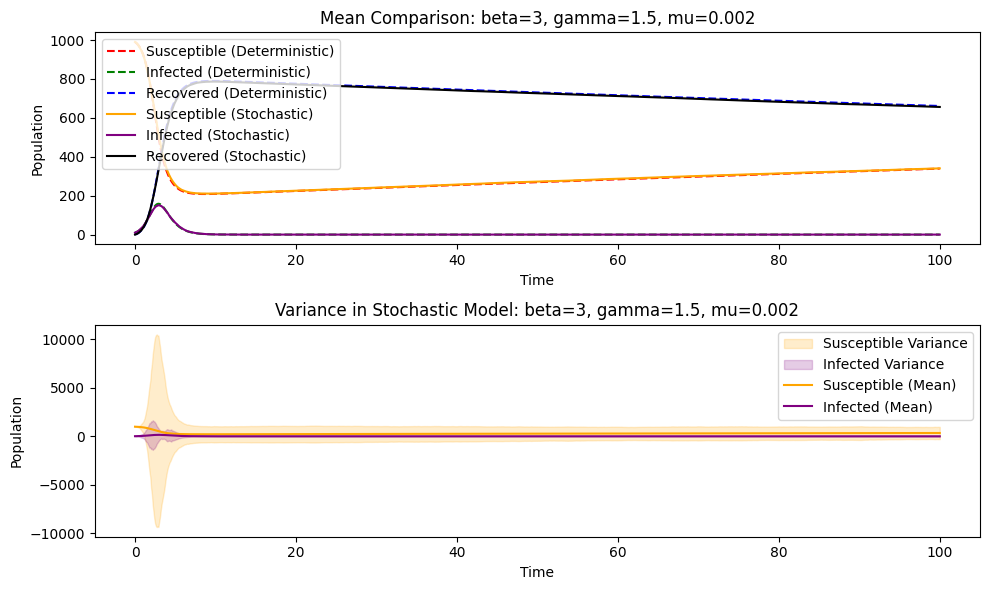

Covariance at time t=0 (mu=0.01, beta=3, gamma=2.5): -51.463524081632656


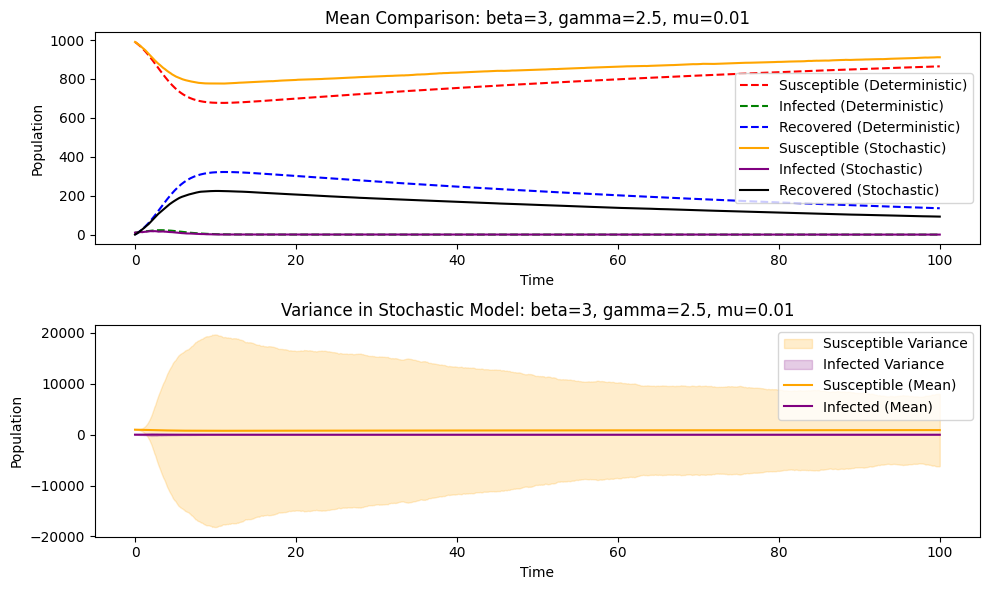

Covariance at time t=0 (mu=0.005, beta=3, gamma=2.5): -49.287318367346934


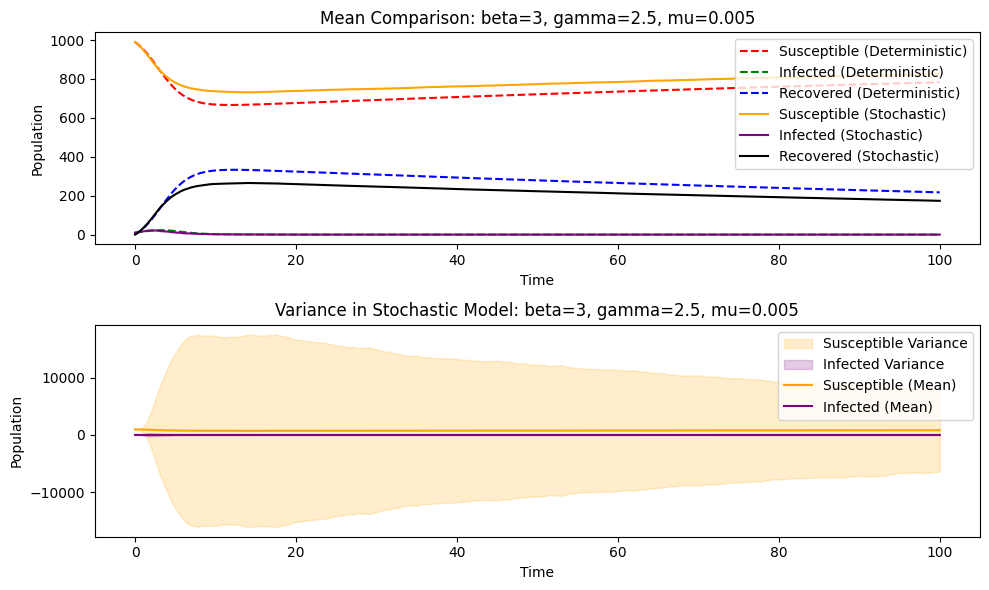

Covariance at time t=0 (mu=0.002, beta=3, gamma=2.5): -35.91796367346939


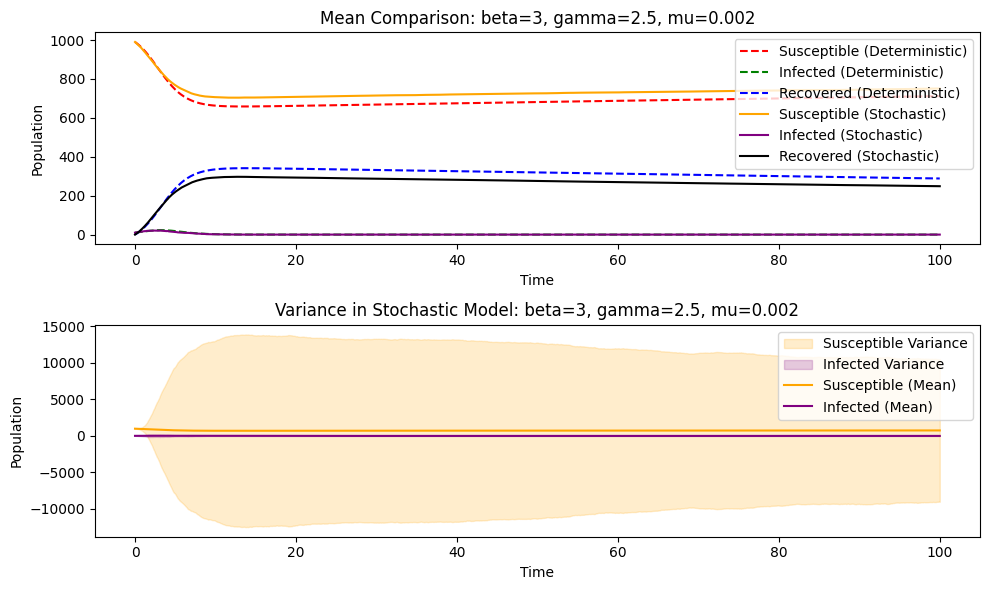

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
from scipy.interpolate import interp1d
import math

def SIR_model_dem(t, y, beta, gamma, miu):
    S, I, R = y
    dSdt = miu - beta * S * I - miu * S
    dIdt = beta * S * I - gamma * I - miu * I
    dRdt = gamma * I - miu * R
    return [dSdt, dIdt, dRdt]

def SIR_gillespie(t_break, beta, gamma, miu):
    s = [990]
    i = [10]
    r = [0]
    t = [0]

    while t[-1] < t_break:
        N = s[-1] + i[-1] + r[-1]
        if N == 0:
            break
        rate_1 = miu * N
        rate_2 = beta * (s[-1] * i[-1]) / N
        rate_3 = gamma * i[-1]
        rate_4 = miu * s[-1]
        rate_5 = miu * i[-1]
        rate_6 = miu * r[-1]

        r_t = rate_1 + rate_2 + rate_3 + rate_4 + rate_5 + rate_6
        if r_t == 0:
            break

        rand_1 = np.random.uniform(0, 1)
        tau = -math.log(rand_1) / r_t
        t.append(t[-1] + tau)

        rand_2 = np.random.uniform(0, 1)
        p = rand_2 * r_t
        cumulative_rate = 0
        if cumulative_rate < p <= (cumulative_rate + rate_1):
            s.append(s[-1] + 1)
            i.append(i[-1])
            r.append(r[-1])
        cumulative_rate += rate_1
        if cumulative_rate < p <= (cumulative_rate + rate_2):
            if s[-1] > 0:
                s.append(s[-1] - 1)
                i.append(i[-1] + 1)
                r.append(r[-1])
        cumulative_rate += rate_2
        if cumulative_rate < p <= (cumulative_rate + rate_3):
            if i[-1] > 0:
                s.append(s[-1])
                i.append(i[-1] - 1)
                r.append(r[-1] + 1)
        cumulative_rate += rate_3
        if cumulative_rate < p <= (cumulative_rate + rate_4):
            if s[-1] > 0:
                s.append(s[-1] - 1)
                i.append(i[-1])
                r.append(r[-1])
        cumulative_rate += rate_4
        if cumulative_rate < p <= (cumulative_rate + rate_5):
            if i[-1] > 0:
                s.append(s[-1])
                i.append(i[-1] - 1)
                r.append(r[-1])
        cumulative_rate += rate_5
        if cumulative_rate < p <= (cumulative_rate + rate_6):
            if r[-1] > 0:
                s.append(s[-1])
                i.append(i[-1])
                r.append(r[-1] - 1)
        cumulative_rate += rate_6
    return t, s, i, r

# Parameters
t_break = 100
beta_values = [1, 2, 3]  # Example beta values
gamma_values = [0.5, 1.5, 2.5] # Example gamma values
mu_values = [1/100, 1/200, 1/500] # Example birth/death rates

# Number of time points in the deterministic solution
num_points = 1000

# Run multiple stochastic simulations and deterministic model for comparison
num_simulations = 50

for beta in beta_values:
    for gamma in gamma_values:
        for miu in mu_values:
            # Run deterministic model
            t_span = [0, 100]
            t_eval = np.linspace(0, 100, num_points)
            sol = solve_ivp(SIR_model_dem, t_span, [0.99, 0.01, 0], args=(beta, gamma, miu), t_eval=t_eval)
            S_det, I_det, R_det = sol.y

            # Run stochastic simulations
            S_stochastic = []
            I_stochastic = []
            R_stochastic = []
            for _ in range(num_simulations):
                t, s, i, r = SIR_gillespie(t_break, beta, gamma, miu)

                # Interpolate stochastic results to match deterministic time points
                f_s = interp1d(t, s, kind='previous', bounds_error=False, fill_value="extrapolate")
                f_i = interp1d(t, i, kind='previous', bounds_error=False, fill_value="extrapolate")
                f_r = interp1d(t, r, kind='previous', bounds_error=False, fill_value="extrapolate")

                s_resampled = f_s(t_eval)
                i_resampled = f_i(t_eval)
                r_resampled = f_r(t_eval)

                S_stochastic.append(s_resampled)
                I_stochastic.append(i_resampled)
                R_stochastic.append(r_resampled)

            # Convert to NumPy arrays for easier manipulation
            S_stochastic = np.array(S_stochastic)
            I_stochastic = np.array(I_stochastic)
            R_stochastic = np.array(R_stochastic)

            # Calculate variance, covariance, and compare means
            S_mean = np.mean(S_stochastic, axis=0)
            I_mean = np.mean(I_stochastic, axis=0)
            R_mean = np.mean(R_stochastic, axis=0)
            S_var = np.var(S_stochastic, axis=0)
            I_var = np.var(I_stochastic, axis=0)

            # Calculate covariance over time
            cov_SI = [np.cov(S_stochastic[:, t], I_stochastic[:, t])[0, 1] for t in range(len(t_eval))]
            cov_SI = np.array(cov_SI)
            cov_SI = np.mean(cov_SI, axis=0)

            print(f"Covariance at time t=0 (mu={miu}, beta={beta}, gamma={gamma}): {cov_SI}")

            # Plot mean comparison (Deterministic vs Stochastic)
            plt.figure(figsize=(10, 6))
            plt.subplot(2, 1, 1)
            plt.plot(sol.t, S_det*1000, label='Susceptible (Deterministic)', color='red', linestyle='--')
            plt.plot(sol.t, I_det*1000, label='Infected (Deterministic)', color='green', linestyle='--')
            plt.plot(sol.t, R_det*1000, label='Recovered (Deterministic)', color='blue', linestyle='--')
            plt.plot(sol.t, S_mean, label='Susceptible (Stochastic)', color='orange')
            plt.plot(sol.t, I_mean, label='Infected (Stochastic)', color='purple')
            plt.plot(sol.t, R_mean, label='Recovered (Stochastic)', color='black')
            plt.title(f"Mean Comparison: beta={beta}, gamma={gamma}, mu={miu}")
            plt.xlabel('Time')
            plt.ylabel('Population')
            plt.legend()

            # Plot variance for Susceptible and Infected
            plt.subplot(2, 1, 2)
            plt.fill_between(sol.t, S_mean - S_var, S_mean + S_var, alpha=0.2, color='orange', label='Susceptible Variance')
            plt.fill_between(sol.t, I_mean - I_var, I_mean + I_var, alpha=0.2, color='purple', label='Infected Variance')
            plt.plot(sol.t, S_mean, label='Susceptible (Mean)', color='orange')
            plt.plot(sol.t, I_mean, label='Infected (Mean)', color='purple')
            plt.title(f"Variance in Stochastic Model: beta={beta}, gamma={gamma}, mu={miu}")
            plt.xlabel('Time')
            plt.ylabel('Population')
            plt.legend()
            plt.tight_layout()
            plt.show()
# iteration with mean of covariance, probably will need to delete

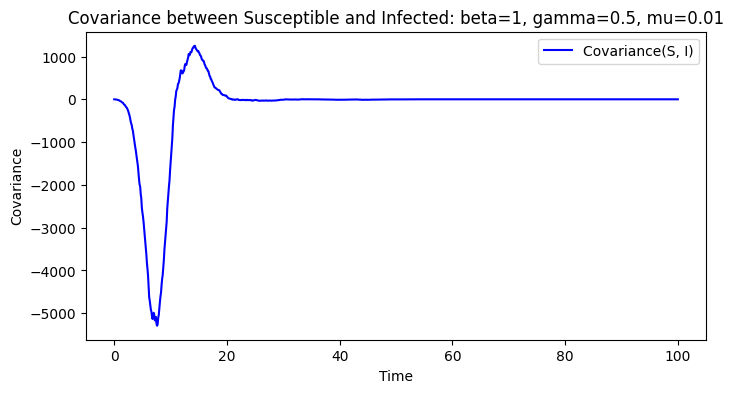

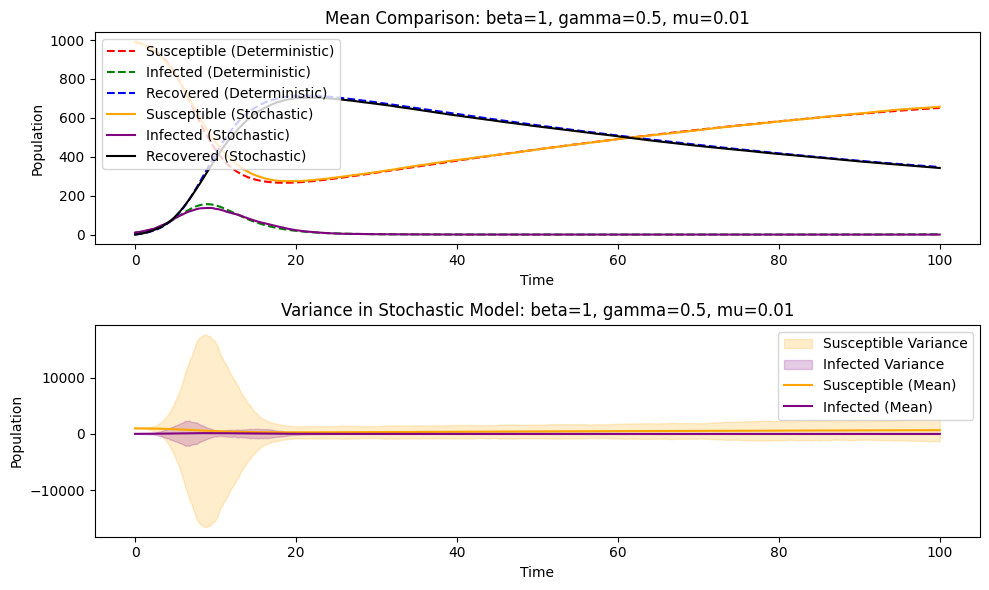

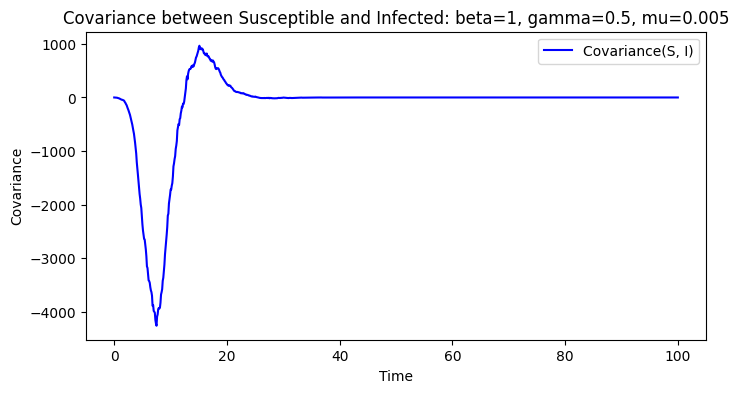

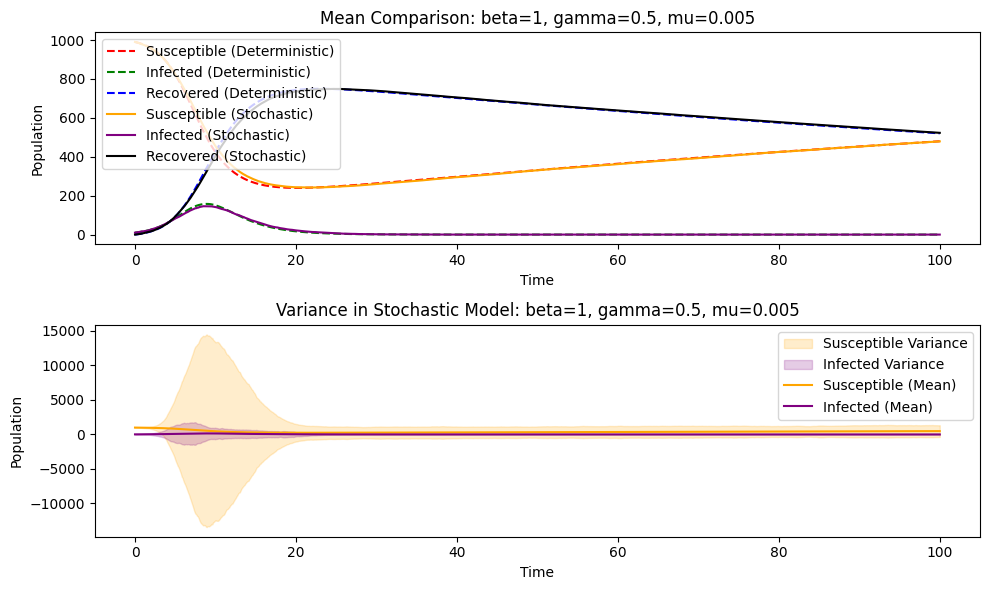

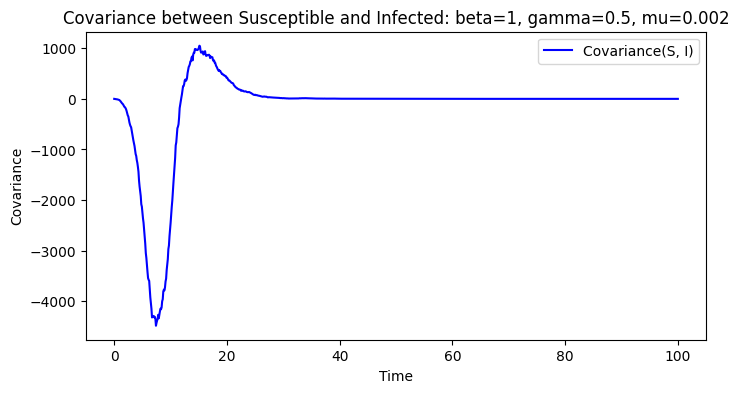

...

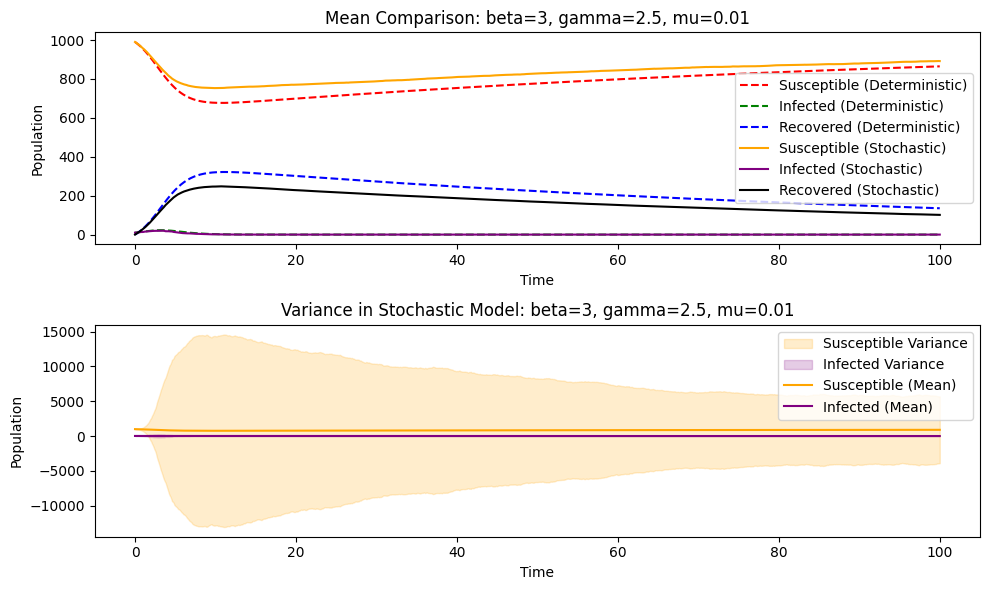

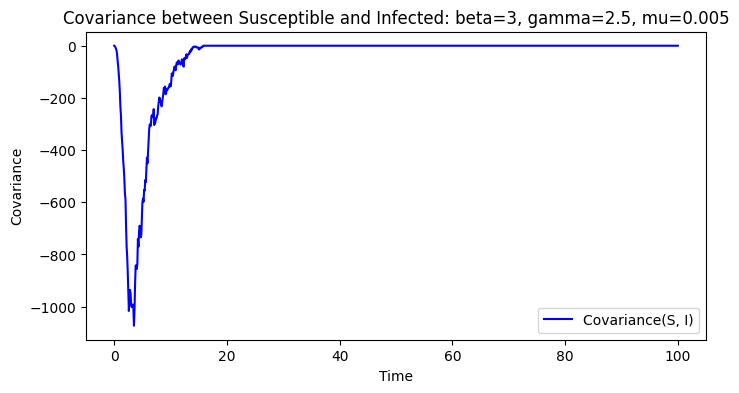

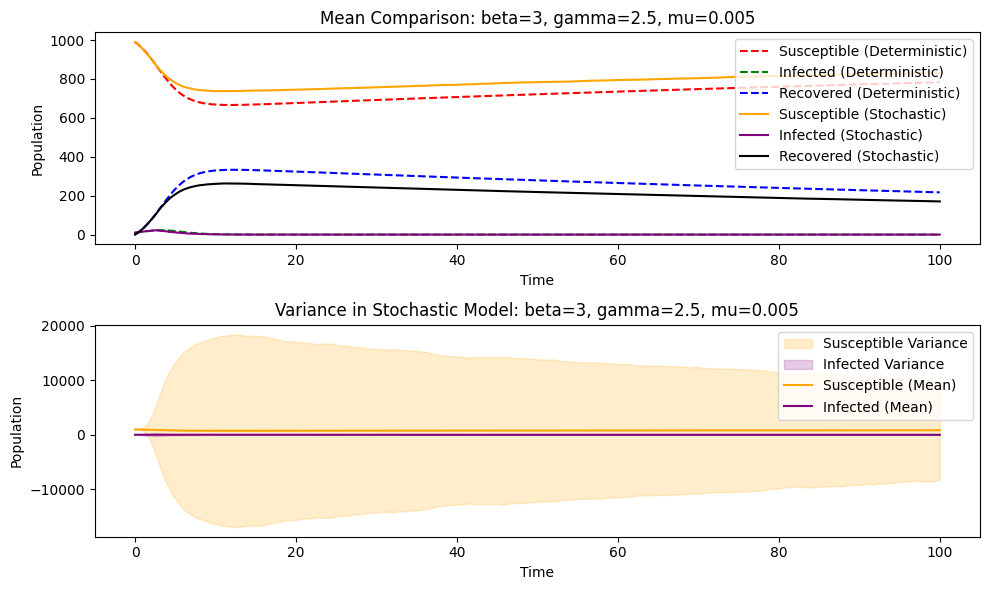

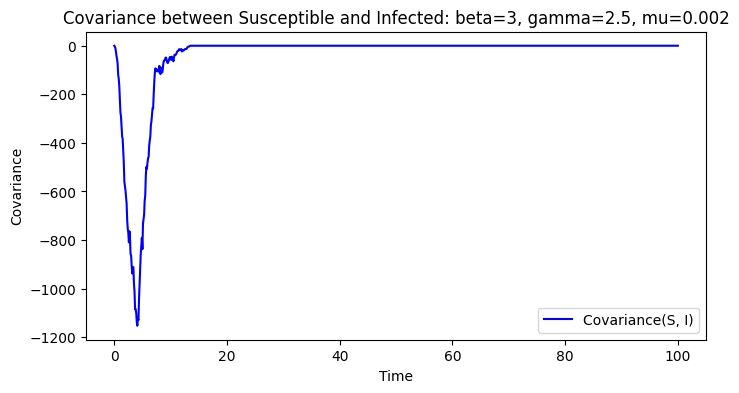

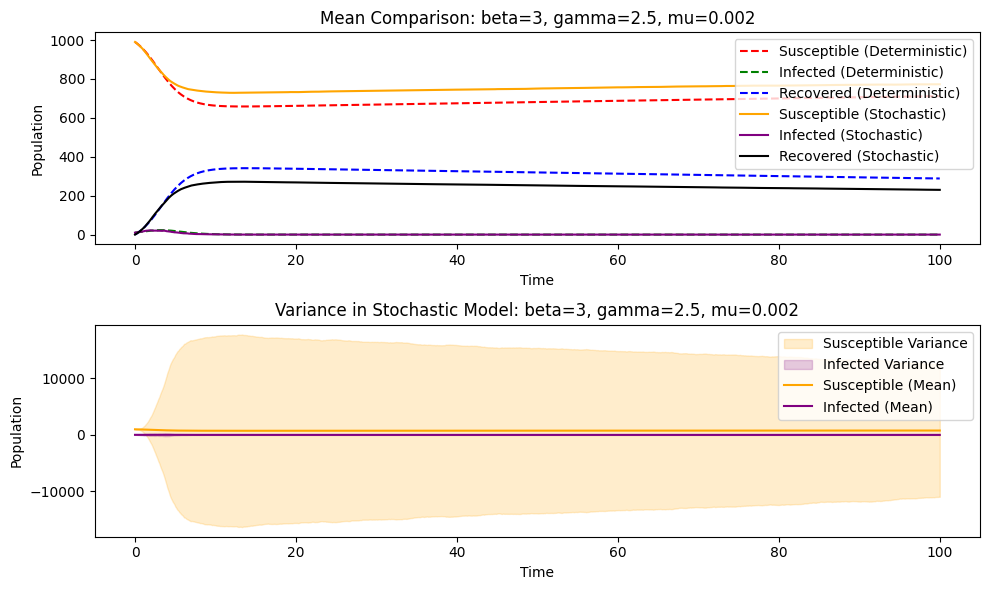

In [19]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
from scipy.interpolate import interp1d
import math

def SIR_model_dem(t, y, beta, gamma, miu):
    S, I, R = y
    dSdt = miu - beta * S * I - miu * S
    dIdt = beta * S * I - gamma * I - miu * I
    dRdt = gamma * I - miu * R
    return [dSdt, dIdt, dRdt]

def SIR_gillespie(t_break, beta, gamma, miu):
    s = [990]
    i = [10]
    r = [0]
    t = [0]

    while t[-1] < t_break:
        N = s[-1] + i[-1] + r[-1]
        if N == 0:
            break
        rate_1 = miu * N
        rate_2 = beta * (s[-1] * i[-1]) / N
        rate_3 = gamma * i[-1]
        rate_4 = miu * s[-1]
        rate_5 = miu * i[-1]
        rate_6 = miu * r[-1]

        r_t = rate_1 + rate_2 + rate_3 + rate_4 + rate_5 + rate_6
        if r_t == 0:
            break

        rand_1 = np.random.uniform(0, 1)
        tau = -math.log(rand_1) / r_t
        t.append(t[-1] + tau)

        rand_2 = np.random.uniform(0, 1)
        p = rand_2 * r_t
        cumulative_rate = 0
        if cumulative_rate < p <= (cumulative_rate + rate_1):
            s.append(s[-1] + 1)
            i.append(i[-1])
            r.append(r[-1])
        cumulative_rate += rate_1
        if cumulative_rate < p <= (cumulative_rate + rate_2):
            if s[-1] > 0:
                s.append(s[-1] - 1)
                i.append(i[-1] + 1)
                r.append(r[-1])
        cumulative_rate += rate_2
        if cumulative_rate < p <= (cumulative_rate + rate_3):
            if i[-1] > 0:
                s.append(s[-1])
                i.append(i[-1] - 1)
                r.append(r[-1] + 1)
        cumulative_rate += rate_3
        if cumulative_rate < p <= (cumulative_rate + rate_4):
            if s[-1] > 0:
                s.append(s[-1] - 1)
                i.append(i[-1])
                r.append(r[-1])
        cumulative_rate += rate_4
        if cumulative_rate < p <= (cumulative_rate + rate_5):
            if i[-1] > 0:
                s.append(s[-1])
                i.append(i[-1] - 1)
                r.append(r[-1])
        cumulative_rate += rate_5
        if cumulative_rate < p <= (cumulative_rate + rate_6):
            if r[-1] > 0:
                s.append(s[-1])
                i.append(i[-1])
                r.append(r[-1] - 1)
        cumulative_rate += rate_6
    return t, s, i, r

# Parameters
t_break = 100
beta_values = [1, 2, 3]  # Example beta values
gamma_values = [0.5, 1.5, 2.5] # Example gamma values
mu_values = [1/100, 1/200, 1/500] # Example birth/death rates

# Number of time points in the deterministic solution
num_points = 1000

# Run multiple stochastic simulations and deterministic model for comparison
num_simulations = 50

for beta in beta_values:
    for gamma in gamma_values:
        for miu in mu_values:
            # Run deterministic model
            t_span = [0, 100]
            t_eval = np.linspace(0, 100, num_points)
            sol = solve_ivp(SIR_model_dem, t_span, [0.99, 0.01, 0], args=(beta, gamma, miu), t_eval=t_eval)
            S_det, I_det, R_det = sol.y

            # Run stochastic simulations
            S_stochastic = []
            I_stochastic = []
            R_stochastic = []
            for _ in range(num_simulations):
                t, s, i, r = SIR_gillespie(t_break, beta, gamma, miu)

                # Interpolate stochastic results to match deterministic time points
                f_s = interp1d(t, s, kind='previous', bounds_error=False, fill_value="extrapolate")
                f_i = interp1d(t, i, kind='previous', bounds_error=False, fill_value="extrapolate")
                f_r = interp1d(t, r, kind='previous', bounds_error=False, fill_value="extrapolate")

                s_resampled = f_s(t_eval)
                i_resampled = f_i(t_eval)
                r_resampled = f_r(t_eval)

                S_stochastic.append(s_resampled)
                I_stochastic.append(i_resampled)
                R_stochastic.append(r_resampled)

            # Convert to NumPy arrays for easier manipulation
            S_stochastic = np.array(S_stochastic)
            I_stochastic = np.array(I_stochastic)
            R_stochastic = np.array(R_stochastic)

            # Calculate variance, covariance, and compare means
            S_mean = np.mean(S_stochastic, axis=0)
            I_mean = np.mean(I_stochastic, axis=0)
            R_mean = np.mean(R_stochastic, axis=0)
            S_var = np.var(S_stochastic, axis=0)
            I_var = np.var(I_stochastic, axis=0)

            # Calculate covariance over time
            cov_SI = [np.cov(S_stochastic[:, t], I_stochastic[:, t])[0, 1] for t in range(len(t_eval))]
            cov_SI = np.array(cov_SI)

            # plot covariance of SI over time
            plt.figure(figsize=(8, 4))
            plt.plot(sol.t, cov_SI, label='Covariance(S, I)', color='blue')
            plt.title(f"Covariance between Susceptible and Infected: beta={beta}, gamma={gamma}, mu={miu}")
            plt.xlabel('Time')
            plt.ylabel('Covariance')
            plt.legend()
            plt.show()

            # Plot mean comparison (Deterministic vs Stochastic)
            plt.figure(figsize=(10, 6))
            plt.subplot(2, 1, 1)
            plt.plot(sol.t, S_det*1000, label='Susceptible (Deterministic)', color='red', linestyle='--')
            plt.plot(sol.t, I_det*1000, label='Infected (Deterministic)', color='green', linestyle='--')
            plt.plot(sol.t, R_det*1000, label='Recovered (Deterministic)', color='blue', linestyle='--')
            plt.plot(sol.t, S_mean, label='Susceptible (Stochastic)', color='orange')
            plt.plot(sol.t, I_mean, label='Infected (Stochastic)', color='purple')
            plt.plot(sol.t, R_mean, label='Recovered (Stochastic)', color='black')
            plt.title(f"Mean Comparison: beta={beta}, gamma={gamma}, mu={miu}")
            plt.xlabel('Time')
            plt.ylabel('Population')
            plt.legend()

            # Plot variance for Susceptible and Infected
            plt.subplot(2, 1, 2)
            plt.fill_between(sol.t, S_mean - S_var, S_mean + S_var, alpha=0.2, color='orange', label='Susceptible Variance')
            plt.fill_between(sol.t, I_mean - I_var, I_mean + I_var, alpha=0.2, color='purple', label='Infected Variance')
            plt.plot(sol.t, S_mean, label='Susceptible (Mean)', color='orange')
            plt.plot(sol.t, I_mean, label='Infected (Mean)', color='purple')
            plt.title(f"Variance in Stochastic Model: beta={beta}, gamma={gamma}, mu={miu}")
            plt.xlabel('Time')
            plt.ylabel('Population')
            plt.legend()
            plt.tight_layout()
            plt.show()

# seems to be the right way to do the second part of ex1,
# need to structure the plots more cleanly and in less space, and interpret results according to what is asked on the exercise sheet.


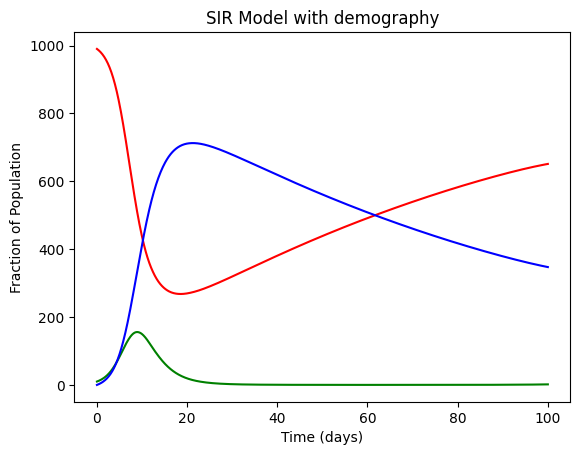

In [39]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
import math

np.random.seed(0)

def SIR_model_dem(t, y, beta, gamma, miu, N):
    S, I, R = y
    dSdt = miu*N - (beta * S * I / N) - miu * S
    dIdt = (beta * S * I / N) - gamma * I - miu*I
    dRdt = gamma * I - miu*R
    return [dSdt, dIdt, dRdt]

# Initial conditions, randomly chosen keeping in mind no recovered population at time zero.
N = 1000
I0 = 10
S0 = N - I0
R0 = N - S0 - I0
y0 = [S0, I0, R0]

# Time span for integration in days, equivalent to a year.
t_span = [0, 100]
# Interval of points for which to store results.
t_eval = np.linspace(0, 100, 1000)

# parameters for the SIR model with demography.
beta_dem = 1
gamma_dem = 0.5
miu_dem = 1/100 # birth/death rate, value taken as shown in examples from "Modeling Infectious Diseases in Humans and Animals"
v = miu_dem
# Solve the differential equations in the scenario with an epidemic.
sol_dem = solve_ivp(SIR_model_dem, t_span, y0, args=(beta_dem, gamma_dem, miu_dem, N), t_eval=t_eval)
# return values of the solution over t from t_span
S_dem, I_dem, R_dem = sol_dem.y

plt.plot(sol_dem.t, S_dem, label="Susceptible", color='red')
plt.plot(sol_dem.t, I_dem, label="Infected", color='green')
plt.plot(sol_dem.t, R_dem, label="Recovered", color='blue')
plt.title("SIR Model with demography")
plt.xlabel("Time (days)")
plt.ylabel("Fraction of Population")
plt.show()

# substitute the SIR model with demography using *1000 in the first ex to this version with N


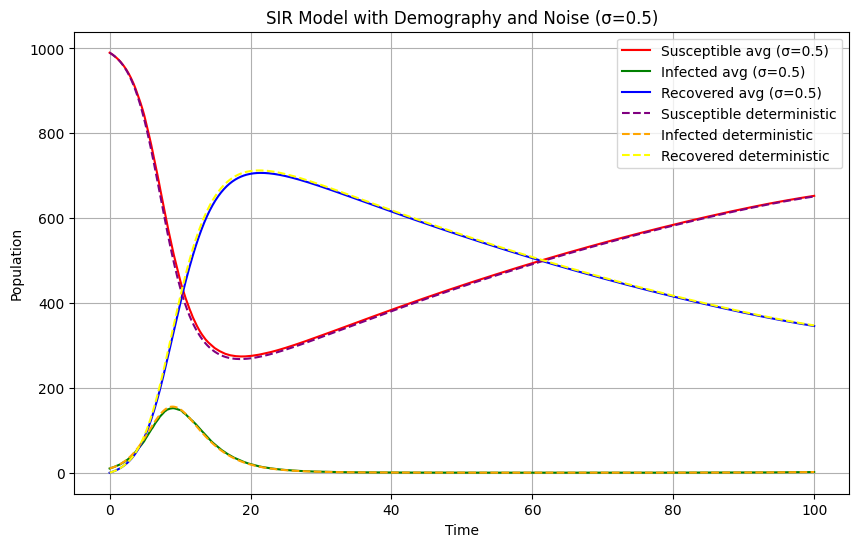

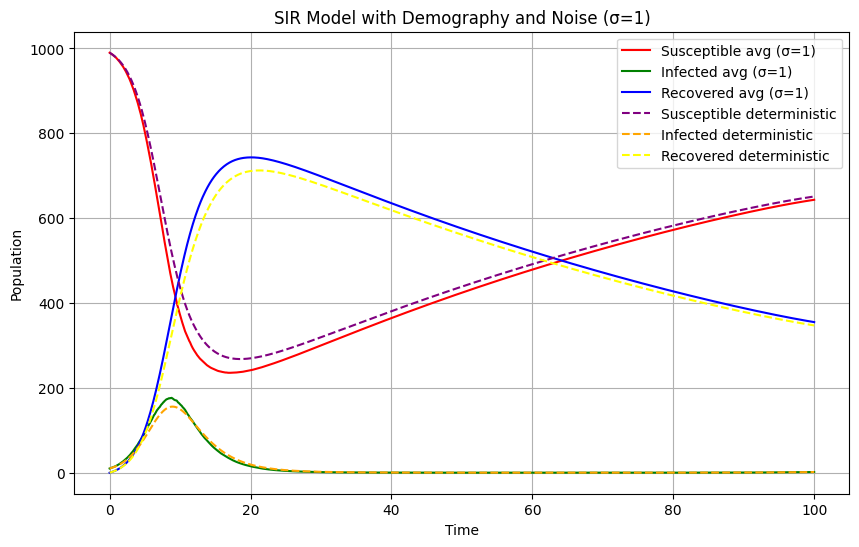

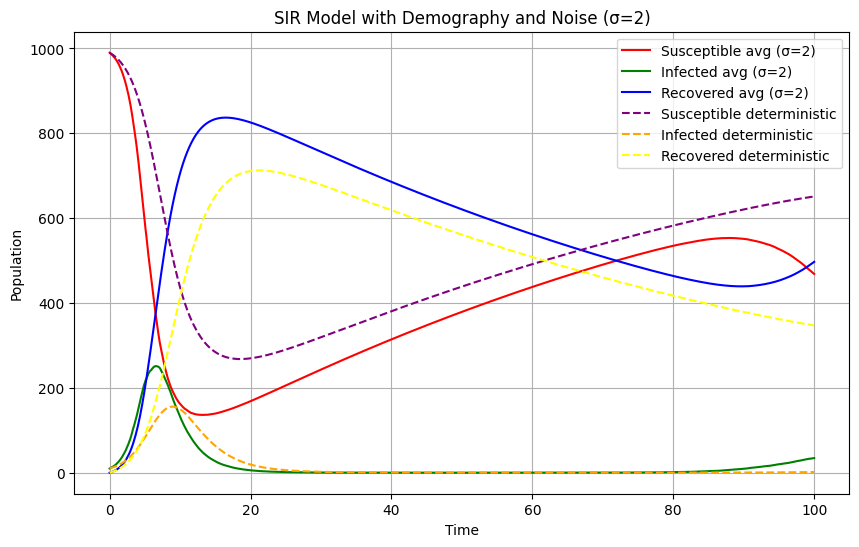

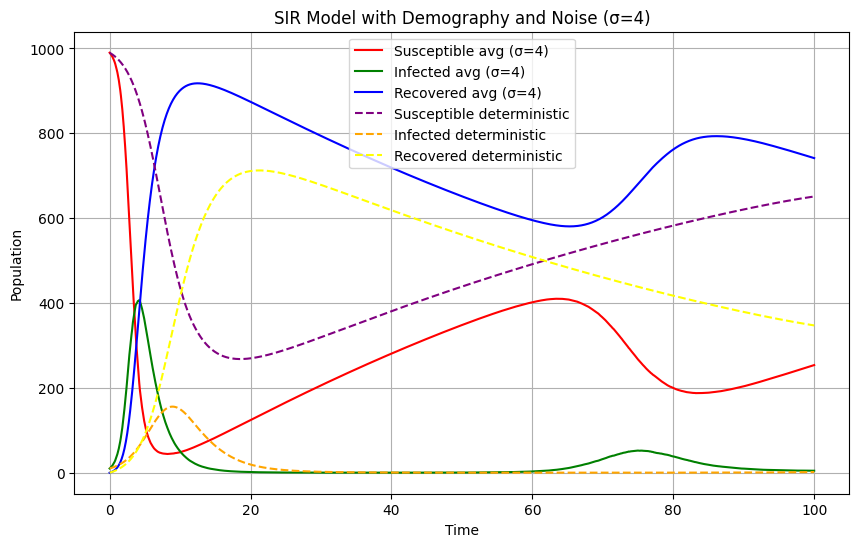

In [48]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

np.random.seed(0)

# Define the SIR model with demography and noise in the transmission rate beta
def SIR_model_with_noise(t, y, beta, gamma, miu, sigma):
    S, I, R = y

    # Add noise to the transmission rate beta (noise at each time step)
    beta_t = np.random.normal(beta, sigma)
    if beta_t < 0:
        beta_t = 0  # Ensure beta does not go negative

    # SIR model equations with demography (births and deaths)
    dSdt = miu*N - beta_t * S * I/N - miu * S
    dIdt = beta_t * S * I/N - gamma * I - miu * I
    dRdt = gamma * I - miu * R

    return [dSdt, dIdt, dRdt]
N = 1000
I0 = 10
S0 = N - I0
R0 = N - S0 - I0
y0 = [S0, I0, R0]

# Time span for integration in days, equivalent to a year.
t_span = [0, 100]
# Interval of points for which to store results.
t_eval = np.linspace(0, 100, 1000)

# parameters for the SIR model with demography.
beta = 1
gamma = 0.5
miu = 1/100 # birth/death rate, value taken as shown in examples from "Modeling Infectious Diseases in Humans and Animals"
v = miu

list_sigma = [0.5, 1, 2, 4]
for sigma in list_sigma:  # Iterate over different values of sigma
    plt.figure(figsize=(10, 6))
    S_stochastic = []
    I_stochastic = []
    R_stochastic = []

    for _ in range(num_simulations):
        # Solve the system of ODEs with solve_ivp and noise in beta
        sol = solve_ivp(SIR_model_with_noise, t_span, [S0, I0, R0],
                        args=(beta, gamma, miu, sigma), t_eval=t_eval)

        S_stochastic.append(sol.y[0])
        I_stochastic.append(sol.y[1])
        R_stochastic.append(sol.y[2])

    S_stochastic = np.array(S_stochastic)
    I_stochastic = np.array(I_stochastic)
    R_stochastic = np.array(R_stochastic)

    # Calculate the mean across all simulations
    S_mean = np.mean(S_stochastic, axis=0)
    I_mean = np.mean(I_stochastic, axis=0)
    R_mean = np.mean(R_stochastic, axis=0)

    # Plot the results for each sigma value
    plt.plot(t_eval, S_mean, label=f"Susceptible avg (σ={sigma})", color='red')
    plt.plot(t_eval, I_mean, label=f"Infected avg (σ={sigma})", color='green')
    plt.plot(t_eval, R_mean, label=f"Recovered avg (σ={sigma})", color='blue')

    # Plot deterministic model for comparison
    plt.plot(sol_dem.t, S_dem, label="Susceptible deterministic", color='purple', linestyle='--')
    plt.plot(sol_dem.t, I_dem, label="Infected deterministic", color='orange', linestyle='--')
    plt.plot(sol_dem.t, R_dem, label="Recovered deterministic", color='yellow', linestyle='--')

    plt.title(f"SIR Model with Demography and Noise (σ={sigma})")
    plt.xlabel("Time")
    plt.ylabel("Population")
    plt.legend()
    plt.grid(True)
    plt.show()



 # is this actually how noise is added in transmission rate?

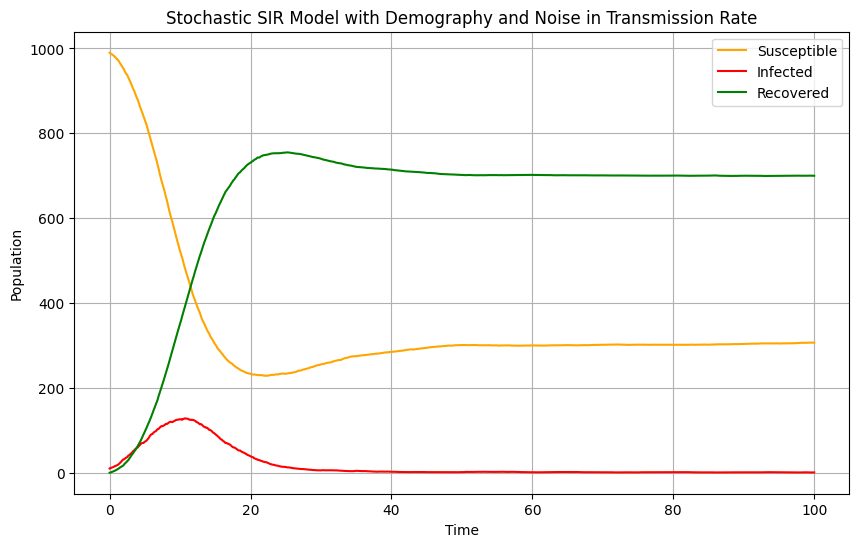

In [54]:
import numpy as np
import matplotlib.pyplot as plt
import math

# Stochastic SIR with demography and noise in transmission rate
def SIR_gillespie_with_noise(t_break, beta, gamma, miu, sigma):
    # Initial conditions
    N = 1000  # Total population
    I = [10]   # Infected
    S = [N-I[0]]  # Susceptible
    R = [N-S[0]-I[0]]    # Recovered
    t = [0]    # Time

    while t[-1] < t_break:
        N = S[-1] + I[-1] + R[-1]  # Total population
        if N == 0 or I[-1] == 0:   # Exit if no population or no infected individuals
            break

        # Rates (with noise added to transmission rate beta)
        beta_with_noise = np.random.normal(beta, sigma)
        if beta_with_noise < 0:
            beta_with_noise = 0  # Ensure the transmission rate doesn't go negative

        rate_birth = miu * N                # Birth rate
        rate_infection = beta_with_noise * S[-1] * I[-1] / N  # Infection rate with noise in beta
        rate_recovery = gamma * I[-1]       # Recovery rate
        rate_death_S = miu * S[-1]          # Death rate for Susceptibles
        rate_death_I = miu * I[-1]          # Death rate for Infected
        rate_death_R = miu * R[-1]          # Death rate for Recovered

        total_rate = (rate_birth + rate_infection + rate_recovery +
                      rate_death_S + rate_death_I + rate_death_R)

        if total_rate == 0:  # Exit if the total rate is zero
            break

        # Time to the next event (Gillespie step)
        tau = -math.log(np.random.uniform()) / total_rate
        t.append(t[-1] + tau)

        # Determine which event occurs
        event_prob = np.random.uniform() * total_rate
        cumulative_rate = 0

        # Birth event (adds to Susceptibles)
        if cumulative_rate < event_prob <= (cumulative_rate + rate_birth):
            S.append(S[-1] + 1)
            I.append(I[-1])
            R.append(R[-1])
        cumulative_rate += rate_birth

        # Infection event (Susceptible to Infected)
        if cumulative_rate < event_prob <= (cumulative_rate + rate_infection):
            if S[-1] > 0:
                S.append(S[-1] - 1)
                I.append(I[-1] + 1)
                R.append(R[-1])
        cumulative_rate += rate_infection

        # Recovery event (Infected to Recovered)
        if cumulative_rate < event_prob <= (cumulative_rate + rate_recovery):
            if I[-1] > 0:
                S.append(S[-1])
                I.append(I[-1] - 1)
                R.append(R[-1] + 1)
        cumulative_rate += rate_recovery

        # Death of Susceptible
        if cumulative_rate < event_prob <= (cumulative_rate + rate_death_S):
            if S[-1] > 0:
                S.append(S[-1] - 1)
                I.append(I[-1])
                R.append(R[-1])
        cumulative_rate += rate_death_S

        # Death of Infected
        if cumulative_rate < event_prob <= (cumulative_rate + rate_death_I):
            if I[-1] > 0:
                S.append(S[-1])
                I.append(I[-1] - 1)
                R.append(R[-1])
        cumulative_rate += rate_death_I

        # Death of Recovered
        if cumulative_rate < event_prob <= (cumulative_rate + rate_death_R):
            if R[-1] > 0:
                S.append(S[-1])
                I.append(I[-1])
                R.append(R[-1] - 1)
        cumulative_rate += rate_death_R

    return t, S, I, R

# Parameters
t_break = 100
beta = 1.5        # Mean transmission rate
gamma = 0.5       # Recovery rate
miu = 1 / 100     # Birth and death rate
sigma = 2     # Noise standard deviation for beta

# Number of simulations
num_simulations = 20
t_eval = np.linspace(0, t_break, 1000)

# Store simulation results
S_stochastic = []
I_stochastic = []
R_stochastic = []

for _ in range(num_simulations):
    t, s, i, r = SIR_gillespie_with_noise(t_break, beta, gamma, miu, sigma)

    # Interpolating to the evaluation points
    s_resampled = np.interp(t_eval, t, s)
    i_resampled = np.interp(t_eval, t, i)
    r_resampled = np.interp(t_eval, t, r)

    S_stochastic.append(s_resampled)
    I_stochastic.append(i_resampled)
    R_stochastic.append(r_resampled)

# Convert to NumPy arrays for easier analysis
S_stochastic = np.array(S_stochastic)
I_stochastic = np.array(I_stochastic)
R_stochastic = np.array(R_stochastic)

# Calculate mean values
S_mean = np.mean(S_stochastic, axis=0)
I_mean = np.mean(I_stochastic, axis=0)
R_mean = np.mean(R_stochastic, axis=0)

# Plot the mean results
plt.figure(figsize=(10, 6))
plt.plot(t_eval, S_mean, label="Susceptible", color='orange')
plt.plot(t_eval, I_mean, label="Infected", color='red')
plt.plot(t_eval, R_mean, label="Recovered", color='green')
plt.title("Stochastic SIR Model with Demography and Noise in Transmission Rate")
plt.xlabel("Time")
plt.ylabel("Population")
plt.legend()
plt.grid(True)
plt.show()

# GA with noise in case this is what we have to do..
